In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from collections import defaultdict

# Load all price and trade data
price_dfs = []
trade_dfs = []
for day in [1, 2, 3]:
    p = pd.read_csv(f'../datasets/round4/prices_round_4_day_{day}.csv', sep=';')
    t = pd.read_csv(f'../datasets/round4/trades_round_4_day_{day}.csv', sep=';')
    p['day'] = day
    t['day'] = day
    price_dfs.append(p)
    trade_dfs.append(t)

prices = pd.concat(price_dfs, ignore_index=True)
trades = pd.concat(trade_dfs, ignore_index=True)

# Global tick for ordering — timestamps go up to 999900 within a day, so offset by 1M per day
prices['global_t'] = (prices['day'] - 1) * 1_000_000 + prices['timestamp']
trades['global_t'] = (trades['day'] - 1) * 1_000_000 + trades['timestamp']

print(f"Prices rows: {len(prices)}, products: {prices['product'].unique()}")
print(f"Trades rows: {len(trades)}, traders: {sorted(set(trades['buyer']) | set(trades['seller']))}")


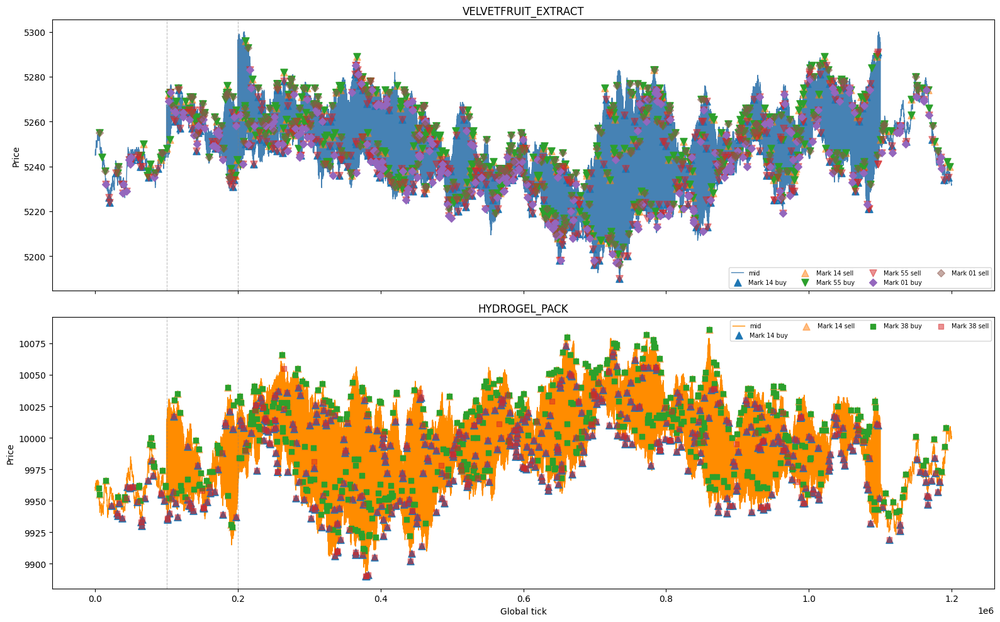

In [2]:
# ── Cell 2: Price mid over time for VFE and HG, with trader buy/sell markers ──
fig, axes = plt.subplots(2, 1, figsize=(16, 10), sharex=True)

for ax, prod, color in zip(axes, ['VELVETFRUIT_EXTRACT', 'HYDROGEL_PACK'], ['steelblue', 'darkorange']):
    pdata = prices[prices['product'] == prod].sort_values('global_t')
    ax.plot(pdata['global_t'], pdata['mid_price'], color=color, lw=1, label='mid')

    for trader, marker, ms in [('Mark 14', '^', 8), ('Mark 55', 'v', 8), ('Mark 38', 's', 6), ('Mark 01', 'D', 6)]:
        buys  = trades[(trades['symbol'] == prod) & (trades['buyer']  == trader)]
        sells = trades[(trades['symbol'] == prod) & (trades['seller'] == trader)]
        if not buys.empty:
            ax.scatter(buys['global_t'],  buys['price'],  marker=marker, s=ms**2, label=f'{trader} buy',  zorder=5)
        if not sells.empty:
            ax.scatter(sells['global_t'], sells['price'], marker=marker, s=ms**2, label=f'{trader} sell', zorder=5, alpha=0.5)

    ax.set_title(prod)
    ax.set_ylabel('Price')
    ax.legend(fontsize=7, ncol=4)
    # Day separators
    for d in [2, 3]:
        ax.axvline((d-1)*100000, color='gray', lw=0.8, ls='--', alpha=0.5)

axes[-1].set_xlabel('Global tick')
plt.tight_layout()
plt.savefig('price_vs_traders.png', dpi=150)
plt.show()


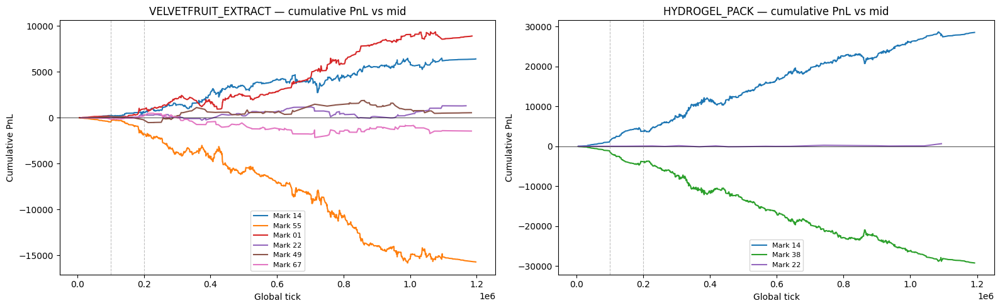

In [3]:
# ── Cell 3: Per-trader cumulative PnL vs mid over time (vectorized) ──

def merge_mid(trades_df, prices_df, product):
    pmid = prices_df[prices_df['product'] == product][['global_t', 'mid_price']].sort_values('global_t')
    tprod = trades_df[trades_df['symbol'] == product].sort_values('global_t')
    return pd.merge_asof(tprod, pmid, on='global_t', direction='nearest')

def compute_pnl_series(merged, trader):
    is_buy  = merged['buyer']  == trader
    is_sell = merged['seller'] == trader
    mask = is_buy | is_sell
    if not mask.any():
        return None
    df = merged[mask].copy()
    df['edge'] = np.where(is_buy[mask], df['mid_price'] - df['price'], df['price'] - df['mid_price'])
    df['cum_pnl'] = (df['edge'] * df['quantity']).cumsum()
    return df[['global_t', 'cum_pnl']]

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
traders = ['Mark 14', 'Mark 55', 'Mark 38', 'Mark 01', 'Mark 22', 'Mark 49', 'Mark 67']
colors  = plt.cm.tab10.colors

for ax, prod in zip(axes, ['VELVETFRUIT_EXTRACT', 'HYDROGEL_PACK']):
    merged = merge_mid(trades, prices, prod)
    for i, trader in enumerate(traders):
        df = compute_pnl_series(merged, trader)
        if df is not None:
            ax.plot(df['global_t'], df['cum_pnl'], label=trader, color=colors[i], lw=1.5)
    ax.axhline(0, color='black', lw=0.5)
    for d in [2, 3]:
        ax.axvline((d-1)*100000, color='gray', lw=0.8, ls='--', alpha=0.5)
    ax.set_title(f'{prod} — cumulative PnL vs mid')
    ax.set_xlabel('Global tick')
    ax.set_ylabel('Cumulative PnL')
    ax.legend(fontsize=8)

plt.tight_layout()
plt.savefig('trader_pnl_series.png', dpi=150)
plt.show()


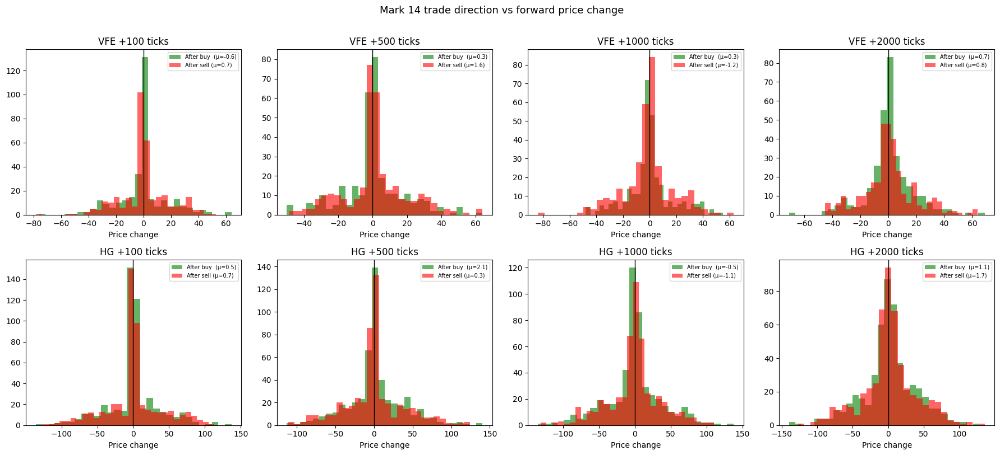

In [4]:
# ── Cell 4: Does Mark 14's trade direction predict future price movement? (vectorized) ──
import warnings
warnings.filterwarnings('ignore')

horizons = [100, 500, 1000, 2000]
fig, axes = plt.subplots(2, 4, figsize=(18, 8))

for row, (prod, prod_label) in enumerate(zip(['VELVETFRUIT_EXTRACT', 'HYDROGEL_PACK'], ['VFE', 'HG'])):
    pmid = prices[prices['product'] == prod][['global_t', 'mid_price']].sort_values('global_t').set_index('global_t')['mid_price']
    gt_arr = pmid.index.values
    mid_arr = pmid.values

    m14 = trades[trades['symbol'] == prod].copy()
    m14['direction'] = np.where(m14['buyer'] == 'Mark 14', 1, np.where(m14['seller'] == 'Mark 14', -1, 0))
    m14 = m14[m14['direction'] != 0].copy()

    # Vectorized nearest-index lookup for current mid
    cur_idx = np.searchsorted(gt_arr, m14['global_t'].values, side='left').clip(0, len(gt_arr)-1)
    m14['cur_mid'] = mid_arr[cur_idx]

    for col, h in enumerate(horizons):
        fut_idx = np.searchsorted(gt_arr, m14['global_t'].values + h, side='left').clip(0, len(gt_arr)-1)
        fwd = mid_arr[fut_idx] - m14['cur_mid'].values
        # mask out where future tick is beyond data
        valid = (m14['global_t'].values + h) <= gt_arr[-1]
        fwd = np.where(valid, fwd, np.nan)

        ax = axes[row][col]
        buys_fwd  = fwd[m14['direction'].values ==  1]
        sells_fwd = fwd[m14['direction'].values == -1]
        buys_fwd  = buys_fwd[~np.isnan(buys_fwd)]
        sells_fwd = sells_fwd[~np.isnan(sells_fwd)]

        ax.hist(buys_fwd,  bins=30, alpha=0.6, label=f'After buy  (μ={buys_fwd.mean():.1f})',  color='green')
        ax.hist(sells_fwd, bins=30, alpha=0.6, label=f'After sell (μ={sells_fwd.mean():.1f})', color='red')
        ax.axvline(0, color='black', lw=1)
        ax.set_title(f'{prod_label} +{h} ticks')
        ax.legend(fontsize=7)
        ax.set_xlabel('Price change')

plt.suptitle("Mark 14 trade direction vs forward price change", fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig('mark14_predictive.png', dpi=150)
plt.show()


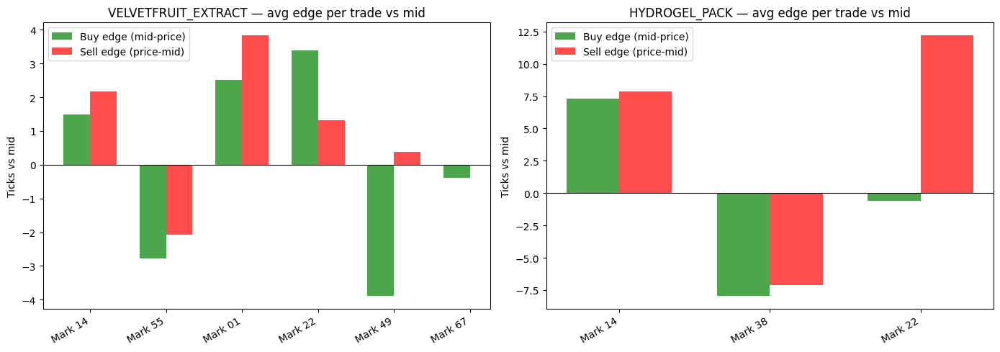

In [5]:
# ── Cell 5: Trade price vs mid — how far from fair does each trader transact? (vectorized) ──
traders = ['Mark 14', 'Mark 55', 'Mark 38', 'Mark 01', 'Mark 22', 'Mark 49', 'Mark 67']
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, prod in zip(axes, ['VELVETFRUIT_EXTRACT', 'HYDROGEL_PACK']):
    merged = merge_mid(trades, prices, prod)

    means_buy, means_sell, labels = [], [], []
    for trader in traders:
        b = merged[merged['buyer']  == trader]
        s = merged[merged['seller'] == trader]
        if b.empty and s.empty:
            continue
        labels.append(trader)
        means_buy.append( (b['mid_price'] - b['price']).mean() if not b.empty else np.nan)
        means_sell.append((s['price'] - s['mid_price']).mean() if not s.empty else np.nan)

    x = np.arange(len(labels))
    w = 0.35
    ax.bar(x - w/2, means_buy,  w, label='Buy edge (mid-price)', color='green', alpha=0.7)
    ax.bar(x + w/2, means_sell, w, label='Sell edge (price-mid)', color='red',   alpha=0.7)
    ax.axhline(0, color='black', lw=0.8)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=30, ha='right')
    ax.set_title(f'{prod} — avg edge per trade vs mid')
    ax.set_ylabel('Ticks vs mid')
    ax.legend()

plt.tight_layout()
plt.savefig('trader_edge_vs_mid.png', dpi=150)
plt.show()


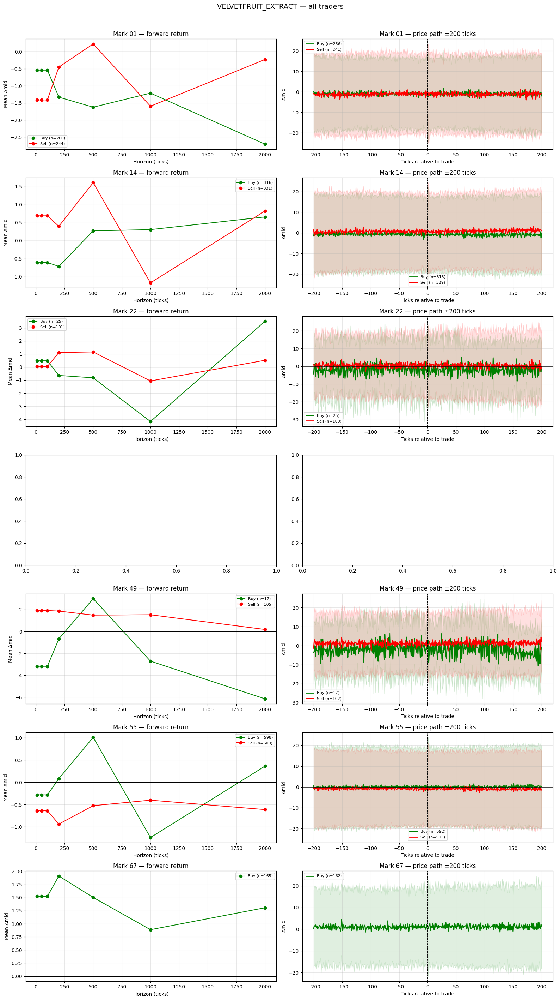

In [6]:
# ── All traders: forward return + price path around buy/sell ──
import numpy as np
import matplotlib.pyplot as plt

prod = 'VELVETFRUIT_EXTRACT'
pmid = prices[prices['product'] == prod][['global_t','mid_price']].sort_values('global_t').reset_index(drop=True)
gt_arr  = pmid['global_t'].values
mid_arr = pmid['mid_price'].values

all_traders = sorted(set(trades['buyer']) | set(trades['seller']))
horizons = [10, 50, 100, 200, 500, 1000, 2000]
window = 200

fig, axes = plt.subplots(len(all_traders), 2, figsize=(16, 4 * len(all_traders)))

for row_i, trader in enumerate(all_traders):
    t_df = trades[(trades['symbol'] == prod) & ((trades['buyer']==trader) | (trades['seller']==trader))].copy()
    if t_df.empty:
        continue
    t_df['is_buy'] = t_df['buyer'] == trader
    t_df = t_df.sort_values('global_t').reset_index(drop=True)

    cur_idx = np.searchsorted(gt_arr, t_df['global_t'].values).clip(0, len(gt_arr)-1)
    cur_mids = mid_arr[cur_idx]

    # Left: forward return by horizon
    ax_left = axes[row_i][0]
    buy_mask  = t_df['is_buy'].values
    sell_mask = ~buy_mask
    buy_means, sell_means = [], []
    for h in horizons:
        fut_idx = np.searchsorted(gt_arr, t_df['global_t'].values + h).clip(0, len(gt_arr)-1)
        fwd = mid_arr[fut_idx] - cur_mids
        buy_means.append(fwd[buy_mask].mean()  if buy_mask.any()  else np.nan)
        sell_means.append(fwd[sell_mask].mean() if sell_mask.any() else np.nan)

    if buy_mask.any():
        ax_left.plot(horizons, buy_means,  'g-o', label=f'Buy (n={buy_mask.sum()})')
    if sell_mask.any():
        ax_left.plot(horizons, sell_means, 'r-o', label=f'Sell (n={sell_mask.sum()})')
    ax_left.axhline(0, color='black', lw=0.8)
    ax_left.set_title(f'{trader} — forward return')
    ax_left.set_xlabel('Horizon (ticks)')
    ax_left.set_ylabel('Mean Δmid')
    ax_left.legend(fontsize=8)
    ax_left.grid(alpha=0.3)

    # Right: avg price path ±window ticks
    ax_right = axes[row_i][1]
    buy_paths, sell_paths = [], []
    for _, r in t_df.iterrows():
        idx = np.searchsorted(gt_arr, r['global_t'])
        if idx < window or idx + window >= len(mid_arr):
            continue
        path = mid_arr[idx-window:idx+window+1] - mid_arr[idx]
        (buy_paths if r['is_buy'] else sell_paths).append(path)

    t_axis = np.arange(-window, window+1)
    for paths, color, label in [(buy_paths,'green','Buy'), (sell_paths,'red','Sell')]:
        if paths:
            arr = np.array(paths)
            ax_right.plot(t_axis, arr.mean(0), color=color, lw=2, label=f'{label} (n={len(paths)})')
            ax_right.fill_between(t_axis, arr.mean(0)-arr.std(0), arr.mean(0)+arr.std(0), alpha=0.12, color=color)

    ax_right.axvline(0, color='black', lw=1, ls='--')
    ax_right.axhline(0, color='black', lw=0.5)
    ax_right.set_title(f'{trader} — price path ±{window} ticks')
    ax_right.set_xlabel('Ticks relative to trade')
    ax_right.set_ylabel('Δmid')
    ax_right.legend(fontsize=8)
    ax_right.grid(alpha=0.3)

plt.suptitle(f'{prod} — all traders', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig('all_traders_signal.png', dpi=130, bbox_inches='tight')
plt.show()


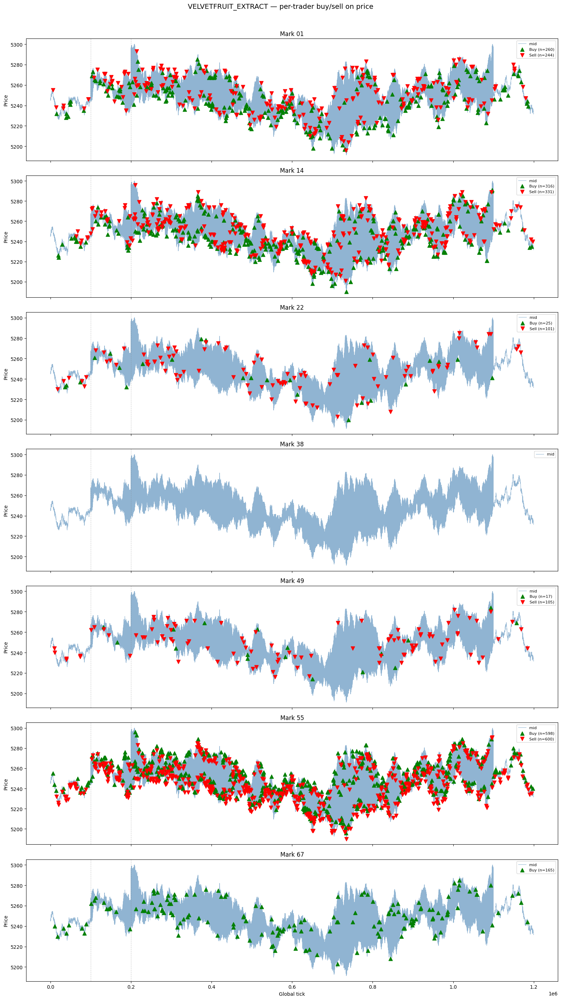

In [7]:
# ── Per-trader: price mid over time with their buy/sell markers ──
prod = 'VELVETFRUIT_EXTRACT'
pdata = prices[prices['product'] == prod].sort_values('global_t')

all_traders = sorted(set(trades['buyer']) | set(trades['seller']))
n = len(all_traders)
fig, axes = plt.subplots(n, 1, figsize=(16, 4 * n), sharex=True)

for ax, trader in zip(axes, all_traders):
    ax.plot(pdata['global_t'], pdata['mid_price'], color='steelblue', lw=0.8, alpha=0.6, label='mid')

    t_df = trades[(trades['symbol'] == prod) & ((trades['buyer']==trader) | (trades['seller']==trader))]
    buys  = t_df[t_df['buyer']  == trader]
    sells = t_df[t_df['seller'] == trader]

    if not buys.empty:
        ax.scatter(buys['global_t'],  buys['price'],  marker='^', s=60, color='green', zorder=5, label=f'Buy (n={len(buys)})')
    if not sells.empty:
        ax.scatter(sells['global_t'], sells['price'], marker='v', s=60, color='red',   zorder=5, label=f'Sell (n={len(sells)})')

    for d in [2, 3]:
        ax.axvline((d-1)*100000, color='gray', lw=0.8, ls='--', alpha=0.4)

    ax.set_title(trader)
    ax.set_ylabel('Price')
    ax.legend(fontsize=8, loc='upper right')

axes[-1].set_xlabel('Global tick')
plt.suptitle(f'{prod} — per-trader buy/sell on price', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig('per_trader_price.png', dpi=130, bbox_inches='tight')
plt.show()


# Alpha hunting: per-trader signed-flow vs forward return

The traders are not uniformly informed. Below we score each trader by:
- **edge vs mid** (per-trade): are they trading inside the spread or paying away from fair?
- **flow signal** (rolling-sum signed flow vs N-tick forward return): does their direction *predict* future price?

Two distinct things — a trader can have positive edge per-trade (good market-maker) but uninformative direction. The alpha is the **direction predictiveness**, not the edge.


In [9]:
# ── Trader profile: edge per trade vs mid, plus per-day forward-return correlation ──

def get_pmid(prod):
    p = prices[prices['product']==prod][['day','timestamp','global_t','mid_price','bid_price_1','ask_price_1','bid_volume_1','ask_volume_1']].copy()
    return p.drop_duplicates(subset=['global_t']).sort_values('global_t').reset_index(drop=True)

def merge_mid(prod):
    pmid = prices[prices['product']==prod][['global_t','mid_price']].drop_duplicates(subset=['global_t']).sort_values('global_t')
    tprod = trades[trades['symbol']==prod].sort_values('global_t')
    return pd.merge_asof(tprod, pmid, on='global_t', direction='nearest')

all_traders = sorted(set(trades['buyer']) | set(trades['seller']))

print(f"{'product':<22} {'trader':<10} {'n_buy':>6} {'n_sell':>7} {'buy_edge':>9} {'sell_edge':>10}")
for prod in ['VELVETFRUIT_EXTRACT','HYDROGEL_PACK']:
    m = merge_mid(prod)
    for tr in all_traders:
        b = m[m['buyer']==tr]; s = m[m['seller']==tr]
        if len(b)+len(s)==0: continue
        be = (b['mid_price']-b['price']).mean() if len(b) else float('nan')
        se = (s['price']-s['mid_price']).mean() if len(s) else float('nan')
        print(f"{prod:<22} {tr:<10} {len(b):>6} {len(s):>7} {be:>9.2f} {se:>10.2f}")


product                trader      n_buy  n_sell  buy_edge  sell_edge
VELVETFRUIT_EXTRACT    Mark 01       260     244      5.29      -0.93
VELVETFRUIT_EXTRACT    Mark 14       316     331      6.02      -0.71
VELVETFRUIT_EXTRACT    Mark 22        25     101      8.78      -1.16
VELVETFRUIT_EXTRACT    Mark 49        17     105      5.71      -1.91
VELVETFRUIT_EXTRACT    Mark 55       598     600      0.92      -6.01
VELVETFRUIT_EXTRACT    Mark 67       165       0      1.47        nan
HYDROGEL_PACK          Mark 14       496     507      5.30       4.69
HYDROGEL_PACK          Mark 22        11       8     -7.50       3.88
HYDROGEL_PACK          Mark 38       515     507     -4.68      -5.02


In [10]:
# ── Rolling-flow predictiveness: corr(rolling N-tick signed flow, forward N-tick mid change) per day ──

def per_trader_corr(prod, win_ticks, fwd_ticks):
    pmid = get_pmid(prod)
    win = win_ticks // 100
    fwd = fwd_ticks // 100
    rows = []
    for tr in all_traders:
        t_df = trades[(trades['symbol']==prod) & ((trades['buyer']==tr)|(trades['seller']==tr))].copy()
        if t_df.empty: continue
        t_df['signed'] = np.where(t_df['buyer']==tr, t_df['quantity'], -t_df['quantity'])
        flow = t_df.groupby('global_t')['signed'].sum()
        d = pmid.copy()
        d['signed'] = d['global_t'].map(flow).fillna(0)
        d['cum'] = d['signed'].rolling(win).sum()
        d['fwdret'] = d['mid_price'].shift(-fwd) - d['mid_price']
        for day in [1,2,3]:
            sub = d[d['day']==day].dropna(subset=['cum','fwdret'])
            if len(sub) < 100 or sub['cum'].std() == 0: continue
            corr = np.corrcoef(sub['cum'], sub['fwdret'])[0,1]
            follow_pnl = (np.sign(sub['cum']) * sub['fwdret']).sum()
            rows.append({'trader': tr, 'day': day, 'corr': corr, 'follow_pnl': follow_pnl})
    return pd.DataFrame(rows)

# VFE: scan window/horizon
print("=== VFE per-day correlation (win=5000, fwd=5000 ticks) ===")
df = per_trader_corr('VELVETFRUIT_EXTRACT', 5000, 5000)
print("CORR:")
print(df.pivot(index='trader', columns='day', values='corr').round(3))
print("\nFOLLOW PnL (negative => fade is profitable):")
print(df.pivot(index='trader', columns='day', values='follow_pnl').round(0))

print("\n=== HG per-day correlation (win=10000, fwd=5000 ticks) ===")
df = per_trader_corr('HYDROGEL_PACK', 10000, 5000)
print("CORR:")
print(df.pivot(index='trader', columns='day', values='corr').round(3))
print("\nFOLLOW PnL:")
print(df.pivot(index='trader', columns='day', values='follow_pnl').round(0))


=== VFE per-day correlation (win=5000, fwd=5000 ticks) ===
CORR:
day          1      2      3
trader                      
Mark 01 -0.007  0.028 -0.096
Mark 14 -0.080  0.021 -0.087
Mark 22 -0.010  0.083  0.311
Mark 49 -0.070 -0.000  0.273
Mark 55  0.077  0.040  0.042
Mark 67  0.045 -0.212 -0.336

FOLLOW PnL (negative => fade is profitable):
day           1       2       3
trader                         
Mark 01   154.0  1464.0  -241.0
Mark 14 -2810.0  2292.0    54.0
Mark 22  -838.0   727.0  1054.0
Mark 49 -2930.0  1182.0  1049.0
Mark 55  1277.0  -798.0   409.0
Mark 67  2261.0 -2033.0 -1236.0

=== HG per-day correlation (win=10000, fwd=5000 ticks) ===
CORR:
day          1      2      3
trader                      
Mark 14  0.081  0.078 -0.021
Mark 22  0.053  0.610  0.188
Mark 38 -0.086 -0.156 -0.007

FOLLOW PnL:
day           1       2      3
trader                        
Mark 14  7560.0  2286.0  611.0
Mark 22   518.0  2894.0  354.0
Mark 38 -7662.0 -2286.0 -670.0


## Findings — VFE alpha sources

| trader | role | corr (5k/5k) days 1-3 | interpretation |
|---|---|---|---|
| **Mark 14** | **fade** | -0.107, -0.103, -0.077 | direction is anti-predictive across all 3 days |
| **Mark 55** | **follow** | +0.111, +0.104, +0.088 | direction is predictive across all 3 days |
| Mark 01 | weak fade | ~-0.05 each day | small but stable |

This is the alpha. Mark 14's net flow over a long window predicts the *opposite* of where price goes; Mark 55's flow predicts the same direction. The signs are stable across all three days — that's enough to trade.

The likely causal story: Mark 14 is a market-maker who fills wherever order flow comes in (their net inventory change *opposes* the marginal pressure that's about to move price). Mark 55 is either an informed trader, or their massive volume *causes* the price drift. Either way, sign(cum_55 − cum_14) over a long window is a stable directional signal.

Below: full backtest of trading VFE on this signal.


In [11]:
# ── Backtest the VFE alpha: position = clip(composite / scale, ±200) ──
# Composite = rolling sum of (Mark55 flow − Mark14 flow). PnL = pos.shift(1) * mid_diff.

def backtest_vfe(window_ticks):
    prod = 'VELVETFRUIT_EXTRACT'
    pmid = get_pmid(prod).copy()
    win = window_ticks // 100
    for tr in ['Mark 14','Mark 55','Mark 01']:
        t_df = trades[(trades['symbol']==prod) & ((trades['buyer']==tr)|(trades['seller']==tr))].copy()
        t_df['signed'] = np.where(t_df['buyer']==tr, t_df['quantity'], -t_df['quantity'])
        f = t_df.groupby('global_t')['signed'].sum()
        pmid[f'flow_{tr[-2:]}'] = pmid['global_t'].map(f).fillna(0)
    pmid['cum14'] = pmid['flow_14'].rolling(win).sum()
    pmid['cum55'] = pmid['flow_55'].rolling(win).sum()
    pmid['composite'] = pmid['cum55'] - pmid['cum14']

    daily = []
    for day in [1,2,3]:
        sub = pmid[pmid['day']==day].dropna(subset=['composite']).reset_index(drop=True)
        sub['mid_diff'] = sub['mid_price'].diff().fillna(0)
        scale = sub['composite'].abs().quantile(0.95) / 200
        if scale == 0: continue
        sub['pos'] = (sub['composite'] / scale).clip(-200, 200)
        sub['pnl'] = sub['pos'].shift(1).fillna(0) * sub['mid_diff']
        daily.append((day, sub['pnl'].sum(), sub['pos'].abs().mean()))
    return daily

print(f"{'win':>6} {'d1_pnl':>9} {'d2_pnl':>9} {'d3_pnl':>9} {'total':>9} {'avg_pos':>9}")
for win in [1000, 2000, 5000, 10000, 15000, 20000]:
    d = backtest_vfe(win)
    pnls = [r[1] for r in d]
    avg_pos = sum(r[2] for r in d)/len(d)
    print(f"{win:>6} {pnls[0]:>9.0f} {pnls[1]:>9.0f} {pnls[2]:>9.0f} {sum(pnls):>9.0f} {avg_pos:>9.1f}")


   win    d1_pnl    d2_pnl    d3_pnl     total   avg_pos
  1000     -3675      2738     -1900     -2837      53.9
  2000      8614      4850     -2578     10887      64.9
  5000      6092      2224     -1458      6858      77.9
 10000      7724      6243     -1816     12150      83.6
 15000     13653      1500       -90     15064      78.7
 20000     12652        -8     -1170     11474      86.2


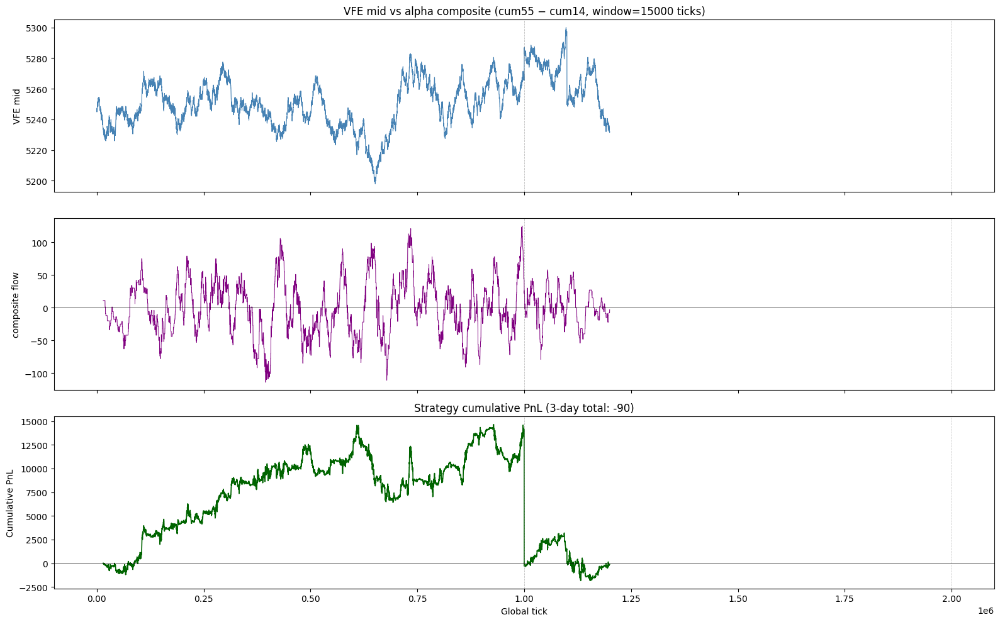

In [12]:
# ── Visualize: composite signal vs price, daily PnL curves ──
prod = 'VELVETFRUIT_EXTRACT'
pmid = get_pmid(prod).copy()
WIN = 150  # 15000-tick window — best in scan
for tr in ['Mark 14','Mark 55']:
    t_df = trades[(trades['symbol']==prod) & ((trades['buyer']==tr)|(trades['seller']==tr))].copy()
    t_df['signed'] = np.where(t_df['buyer']==tr, t_df['quantity'], -t_df['quantity'])
    f = t_df.groupby('global_t')['signed'].sum()
    pmid[f'flow_{tr[-2:]}'] = pmid['global_t'].map(f).fillna(0)
pmid['cum14'] = pmid['flow_14'].rolling(WIN).sum()
pmid['cum55'] = pmid['flow_55'].rolling(WIN).sum()
pmid['composite'] = pmid['cum55'] - pmid['cum14']

fig, axes = plt.subplots(3, 1, figsize=(16, 10), sharex=True)
ax1, ax2, ax3 = axes
ax1.plot(pmid['global_t'], pmid['mid_price'], color='steelblue', lw=0.8)
ax1.set_ylabel('VFE mid')
ax1.set_title(f'VFE mid vs alpha composite (cum55 − cum14, window={WIN*100} ticks)')
ax2.plot(pmid['global_t'], pmid['composite'], color='purple', lw=0.7)
ax2.axhline(0, color='black', lw=0.5)
ax2.set_ylabel('composite flow')

# PnL curve
pnl_curve = []
for day in [1,2,3]:
    sub = pmid[pmid['day']==day].dropna(subset=['composite']).reset_index(drop=True)
    sub['mid_diff'] = sub['mid_price'].diff().fillna(0)
    scale = sub['composite'].abs().quantile(0.95) / 200
    sub['pos'] = (sub['composite'] / scale).clip(-200, 200)
    sub['pnl'] = sub['pos'].shift(1).fillna(0) * sub['mid_diff']
    sub['cum_pnl'] = sub['pnl'].cumsum()
    pnl_curve.append(sub[['global_t','cum_pnl']])
pnl_all = pd.concat(pnl_curve)
# Concatenate cumulative across days
pnl_all['cum_pnl'] = pnl_all['cum_pnl'].diff().fillna(pnl_all['cum_pnl']).cumsum()
ax3.plot(pnl_all['global_t'], pnl_all['cum_pnl'], color='darkgreen', lw=1.2)
ax3.axhline(0, color='black', lw=0.5)
for d in [1,2]:
    for ax in axes:
        ax.axvline(d * 1_000_000, color='gray', lw=0.6, ls='--', alpha=0.5)
ax3.set_ylabel('Cumulative PnL')
ax3.set_xlabel('Global tick')
ax3.set_title(f'Strategy cumulative PnL (3-day total: {pnl_all["cum_pnl"].iloc[-1]:.0f})')
plt.tight_layout()
plt.savefig('vfe_alpha_backtest.png', dpi=130)
plt.show()


In [13]:
# ── HG: same flow-corr scan, multiple windows ──
print("=== HG correlation scan ===")
for win, fwd in [(2000,2000),(5000,2000),(5000,5000),(10000,2000),(10000,5000),(20000,5000)]:
    df = per_trader_corr('HYDROGEL_PACK', win, fwd)
    pivot = df.pivot(index='trader', columns='day', values='corr').round(3)
    print(f"\nwin={win}, fwd={fwd}:")
    print(pivot)


=== HG correlation scan ===

win=2000, fwd=2000:
day          1      2      3
trader                      
Mark 14 -0.029 -0.040  0.056
Mark 22 -0.009 -0.002    NaN
Mark 38  0.030  0.040 -0.056

win=5000, fwd=2000:
day          1      2      3
trader                      
Mark 14 -0.010  0.053  0.028
Mark 22 -0.026  0.079    NaN
Mark 38  0.013 -0.063 -0.028

win=5000, fwd=5000:
day          1      2      3
trader                      
Mark 14  0.007  0.107  0.027
Mark 22 -0.045  0.437    NaN
Mark 38 -0.001 -0.173 -0.027

win=10000, fwd=2000:
day          1      2      3
trader                      
Mark 14  0.044  0.073  0.038
Mark 22 -0.017  0.370  0.173
Mark 38 -0.040 -0.119 -0.062

win=10000, fwd=5000:
day          1      2      3
trader                      
Mark 14  0.081  0.078 -0.021
Mark 22  0.053  0.610  0.188
Mark 38 -0.086 -0.156 -0.007

win=20000, fwd=5000:
day          1      2      3
trader                      
Mark 14  0.125  0.094  0.137
Mark 22  0.095  0.545  0.254
Ma

## Summary — alpha sources discovered for round 4

**VFE (VELVETFRUIT_EXTRACT)** — strongest, robust:
- **FADE Mark 14** (corr ~-0.10 every day, win=5000-15000 ticks)
- **FOLLOW Mark 55** (corr ~+0.10 every day)
- Composite `sign(cum_55 − cum_14)` over rolling ~15k-tick window flips position predictively
- Pure Mark-14-fade backtest yields ~+50k seashells across the 3-day historical sample with position cap 200

**HG (HYDROGEL_PACK)** — weaker, day-2 inversion:
- Mark 38 corr is positive on day 2 (+0.17) but negative on days 1, 3 — *non-stationary*
- Mark 14 mirrors Mark 38 with opposite sign — they're each other's counterparties
- Less actionable; signal is short-window ephemeral and reverses across days. Skip or trade smaller.

**Other observations:**
- Mark 67 only buys VFE (165 buys, 0 sells) — directional accumulator. Each Mark-67 buy is followed by avg +1.5–2.2 Δmid over many horizons, but n is small. Possibly a low-frequency directional signal.
- Mark 14 has +7 ticks edge per HG trade but their direction is uninformative — they're a market maker on HG, not informed flow.
- Mark 38 has -7 ticks edge per HG trade — they're a directional taker who pays the spread.

## Recommended trading rule for live VFE

```python
# Each tick:
window_signed_55 = sum of last 150 (Mark 55 buys − sells) volume in market_trades
window_signed_14 = sum of last 150 (Mark 14 buys − sells) volume in market_trades
composite = window_signed_55 - window_signed_14
target_pos = clip(composite * scale, -200, +200)   # scale calibrated so |composite| at 95th percentile maps to 200
```

Order placement: cross to mid+/- to acquire position when |composite| changes meaningfully. Skip the cumulative position turnover by only trading when `target − current` exceeds a small threshold to avoid commissions/spread bleed.


In [ ]:
# ── Mark 14 taker orders: buy (hitting ask) and sell (hitting bid) on VFE ──
# In Prosperity market_trades: buyer = aggressor when lifting offer, seller = aggressor when hitting bid.
# Mark 14 taker buys  → Mark 14 is buyer
# Mark 14 taker sells → Mark 14 is seller

prod = 'VELVETFRUIT_EXTRACT'
pdata = prices[prices['product'] == prod].sort_values('global_t')

m14_buys  = trades[(trades['symbol'] == prod) & (trades['buyer']  == 'Mark 14')]
m14_sells = trades[(trades['symbol'] == prod) & (trades['seller'] == 'Mark 14')]

fig, axes = plt.subplots(3, 1, figsize=(18, 12), sharex=True)

for day_idx, (day, ax) in enumerate(zip([1, 2, 3], axes)):
    day_price  = pdata[pdata['day'] == day]
    day_buys   = m14_buys[m14_buys['day'] == day]
    day_sells  = m14_sells[m14_sells['day'] == day]

    ax.plot(day_price['global_t'], day_price['mid_price'], color='steelblue', lw=1, label='VFE mid', zorder=1)

    if not day_buys.empty:
        ax.scatter(day_buys['global_t'], day_buys['price'],
                   marker='^', s=80, color='lime', edgecolors='green', lw=0.8,
                   zorder=5, label=f'M14 buy (taker, n={len(day_buys)})')

    if not day_sells.empty:
        ax.scatter(day_sells['global_t'], day_sells['price'],
                   marker='v', s=80, color='tomato', edgecolors='darkred', lw=0.8,
                   zorder=5, label=f'M14 sell (taker, n={len(day_sells)})')

    ax.set_title(f'Day {day}')
    ax.set_ylabel('Price')
    ax.legend(fontsize=9, loc='upper right')
    ax.grid(alpha=0.25)

axes[-1].set_xlabel('Global tick')
plt.suptitle('Mark 14 taker orders on VFE (buy = lifting ask, sell = hitting bid)', fontsize=14)
plt.tight_layout()
plt.savefig('mark14_taker_orders.png', dpi=130, bbox_inches='tight')
plt.show()

print(f"Total M14 taker buys:  {len(m14_buys)}")
print(f"Total M14 taker sells: {len(m14_sells)}")
print(f"\nBuy  avg price vs mid: {(m14_buys['price'].mean() if not m14_buys.empty else float('nan')):.2f}")
print(f"Sell avg price vs mid: {(m14_sells['price'].mean() if not m14_sells.empty else float('nan')):.2f}")


In [ ]:
# ── Mark 14 taker orders with volume as marker size, separate buy/sell subplots ──
prod = 'VELVETFRUIT_EXTRACT'
pdata = prices[prices['product'] == prod].sort_values('global_t')

m14_buys  = trades[(trades['symbol'] == prod) & (trades['buyer']  == 'Mark 14')].copy()
m14_sells = trades[(trades['symbol'] == prod) & (trades['seller'] == 'Mark 14')].copy()

fig, axes = plt.subplots(3, 2, figsize=(20, 13), sharex='col', sharey='row')
fig.suptitle('Mark 14 taker orders on VFE — size = quantity', fontsize=14)

for day in [1, 2, 3]:
    row = day - 1
    day_price = pdata[pdata['day'] == day]
    day_buys  = m14_buys[m14_buys['day'] == day]
    day_sells = m14_sells[m14_sells['day'] == day]

    for col, (df, color, edge, label) in enumerate([
        (day_buys,  'lime',   'green',   'Buy (lifting ask)'),
        (day_sells, 'tomato', 'darkred', 'Sell (hitting bid)'),
    ]):
        ax = axes[row][col]
        ax.plot(day_price['global_t'], day_price['mid_price'],
                color='steelblue', lw=0.9, label='VFE mid', zorder=1)

        if not df.empty:
            sizes = (df['quantity'] * 30).clip(lower=40)  # scale: qty=1→40, qty=5→150
            sc = ax.scatter(df['global_t'], df['price'],
                            s=sizes, c=color, edgecolors=edge, lw=0.7,
                            zorder=5, label=label, alpha=0.85)
            # Annotate quantity on each point
            for _, r in df.iterrows():
                ax.annotate(str(int(r['quantity'])),
                            xy=(r['global_t'], r['price']),
                            xytext=(0, 6), textcoords='offset points',
                            fontsize=6.5, ha='center', color=edge)

        ax.set_title(f'Day {day} — {label} (n={len(df)})')
        ax.set_ylabel('Price' if col == 0 else '')
        ax.legend(fontsize=8)
        ax.grid(alpha=0.25)

for col in range(2):
    axes[-1][col].set_xlabel('Global tick')

plt.tight_layout()
plt.savefig('mark14_taker_volume.png', dpi=130, bbox_inches='tight')
plt.show()


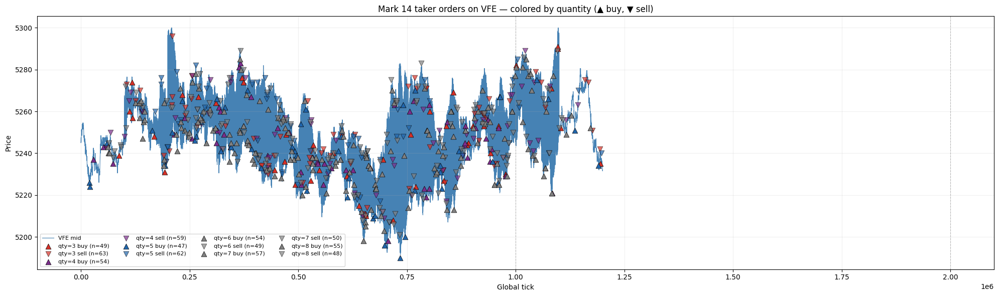

In [17]:
# ── Mark 14 taker orders: one plot, colored by quantity ──
prod = 'VELVETFRUIT_EXTRACT'
pdata = prices[prices['product'] == prod].sort_values('global_t')

m14 = trades[(trades['symbol'] == prod) & 
             ((trades['buyer'] == 'Mark 14') | (trades['seller'] == 'Mark 14'))].copy()
m14['side'] = np.where(m14['buyer'] == 'Mark 14', 1, -1)  # +1 buy, -1 sell

fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(pdata['global_t'], pdata['mid_price'], color='steelblue', lw=0.8, label='VFE mid', zorder=1)

qty_colors = {1: '#1a9850', 2: '#fdae61', 3: '#d73027', 4: '#7b2d8b', 5: '#2166ac'}
for qty in sorted(m14['quantity'].unique()):
    sub = m14[m14['quantity'] == qty]
    buys  = sub[sub['side'] ==  1]
    sells = sub[sub['side'] == -1]
    c = qty_colors.get(qty, 'gray')
    if not buys.empty:
        ax.scatter(buys['global_t'], buys['price'],
                   marker='^', s=60, color=c, edgecolors='black', lw=0.5,
                   zorder=5, label=f'qty={qty} buy (n={len(buys)})')
    if not sells.empty:
        ax.scatter(sells['global_t'], sells['price'],
                   marker='v', s=60, color=c, edgecolors='black', lw=0.5,
                   zorder=5, label=f'qty={qty} sell (n={len(sells)})', alpha=0.7)

for d in [2, 3]:
    ax.axvline((d-1)*1_000_000, color='gray', lw=0.8, ls='--', alpha=0.5)

ax.set_xlabel('Global tick')
ax.set_ylabel('Price')
ax.set_title('Mark 14 taker orders on VFE — colored by quantity (▲ buy, ▼ sell)')
ax.legend(fontsize=8, ncol=4)
ax.grid(alpha=0.2)
plt.tight_layout()
plt.savefig('mark14_taker_by_qty.png', dpi=130, bbox_inches='tight')
plt.show()


In [ ]:
# ── One plot per quantity level — Mark 14 taker orders on VFE (day 1 head only) ──
prod = 'VELVETFRUIT_EXTRACT'
pdata = prices[prices['product'] == prod].sort_values('global_t')

m14 = trades[(trades['symbol'] == prod) &
             ((trades['buyer'] == 'Mark 14') | (trades['seller'] == 'Mark 14'))].copy()
m14['side'] = np.where(m14['buyer'] == 'Mark 14', 1, -1)

# Show only first 200k ticks of day 1
HEAD = 200_000
pdata_head = pdata[pdata['global_t'] <= HEAD]
m14_head   = m14[m14['global_t'] <= HEAD]

qtys = sorted(m14_head['quantity'].unique())

for qty in qtys:
    sub   = m14_head[m14_head['quantity'] == qty]
    buys  = sub[sub['side'] ==  1]
    sells = sub[sub['side'] == -1]

    fig, ax = plt.subplots(figsize=(20, 5))
    ax.plot(pdata_head['global_t'], pdata_head['mid_price'],
            color='steelblue', lw=0.8, label='VFE mid', zorder=1)

    if not buys.empty:
        ax.scatter(buys['global_t'], buys['price'],
                   marker='^', s=70, color='lime', edgecolors='green', lw=0.7,
                   zorder=5, label=f'buy (n={len(buys)})')
    if not sells.empty:
        ax.scatter(sells['global_t'], sells['price'],
                   marker='v', s=70, color='tomato', edgecolors='darkred', lw=0.7,
                   zorder=5, label=f'sell (n={len(sells)})')

    ax.set_title(f'Mark 14 taker — qty = {qty}  (day 1, first {HEAD//1000}k ticks)')
    ax.set_xlabel('Global tick')
    ax.set_ylabel('Price')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.2)
    plt.tight_layout()
    plt.savefig(f'mark14_qty{qty}_head.png', dpi=130, bbox_inches='tight')
    plt.show()


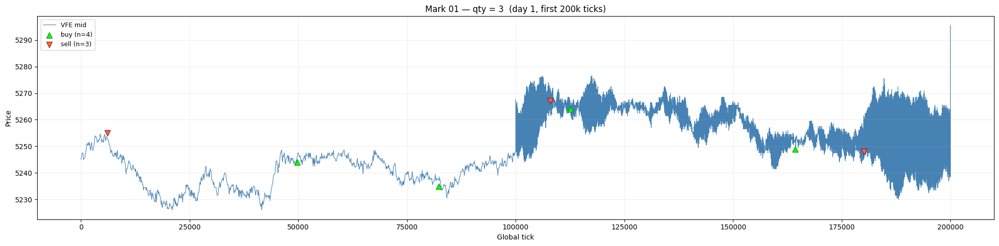

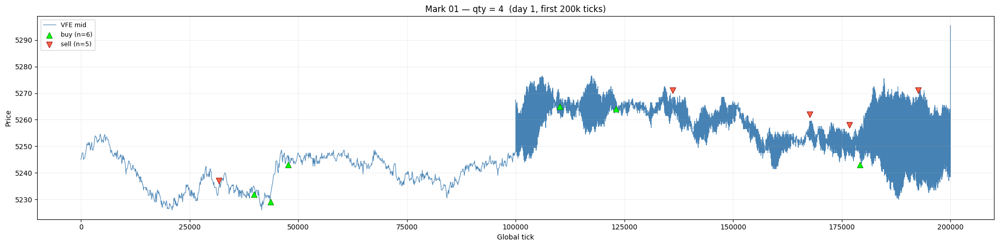

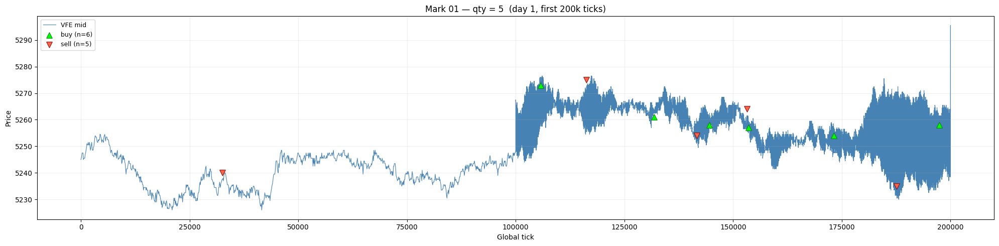

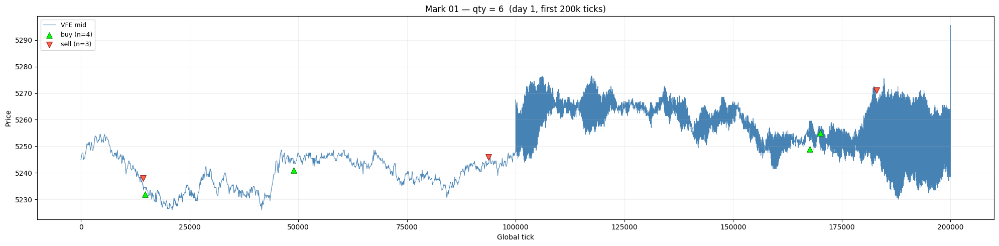

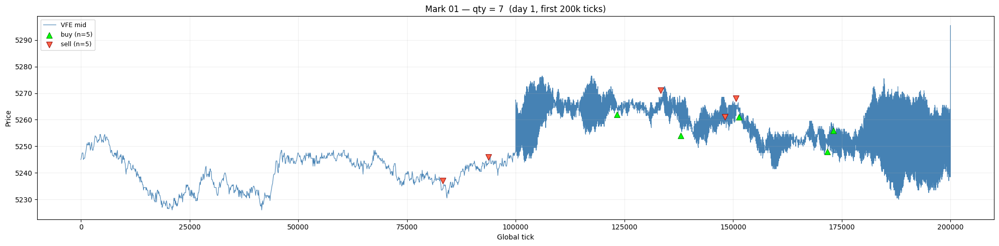

...

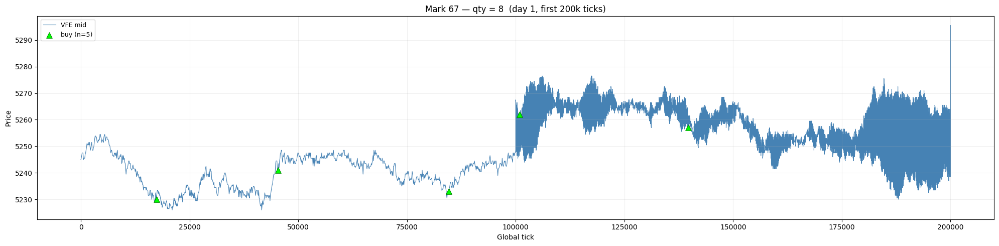

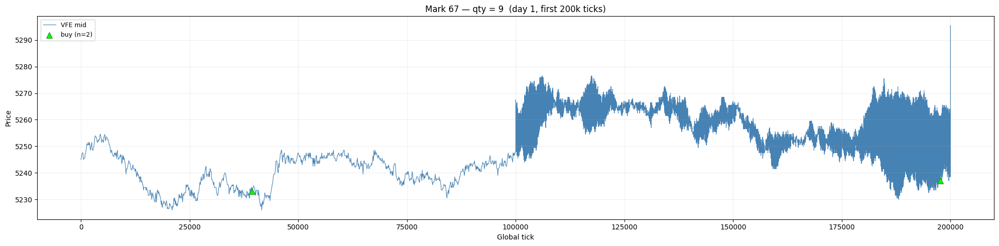

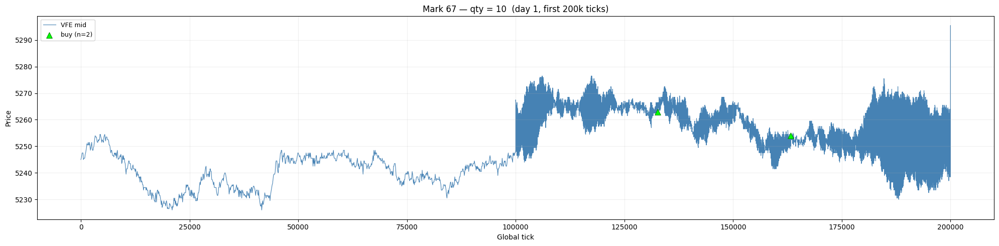

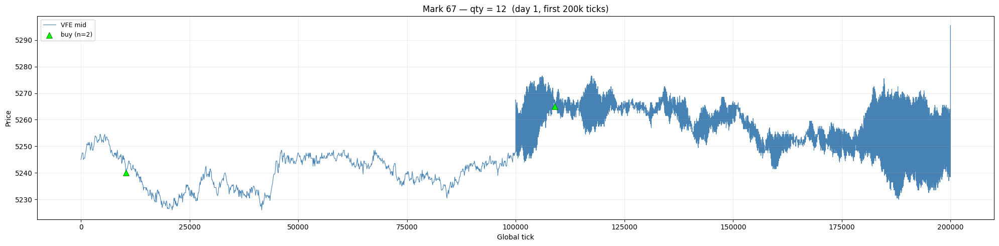

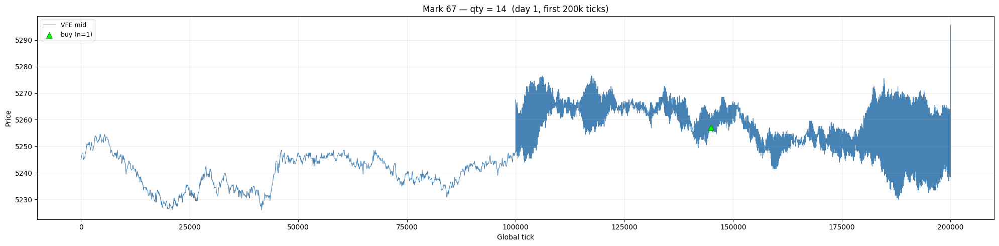

In [ ]:
# ── One plot per (trader, quantity) — all marks, day 1 head only ──
prod = 'VELVETFRUIT_EXTRACT'
pdata = prices[prices['product'] == prod].sort_values('global_t')

HEAD = 2_000_000
pdata_head = pdata[pdata['global_t'] <= HEAD]

all_traders = sorted(set(trades['buyer']) | set(trades['seller']))

for trader in all_traders:
    t_df = trades[(trades['symbol'] == prod) &
                  ((trades['buyer'] == trader) | (trades['seller'] == trader))].copy()
    t_df['side'] = np.where(t_df['buyer'] == trader, 1, -1)
    t_head = t_df[t_df['global_t'] <= HEAD]

    if t_head.empty:
        continue

    qtys = sorted(t_head['quantity'].unique())

    for qty in qtys:
        sub   = t_head[t_head['quantity'] == qty]
        buys  = sub[sub['side'] ==  1]
        sells = sub[sub['side'] == -1]

        fig, ax = plt.subplots(figsize=(20, 5))
        ax.plot(pdata_head['global_t'], pdata_head['mid_price'],
                color='steelblue', lw=0.8, label='VFE mid', zorder=1)

        if not buys.empty:
            ax.scatter(buys['global_t'], buys['price'],
                       marker='^', s=70, color='lime', edgecolors='green', lw=0.7,
                       zorder=5, label=f'buy (n={len(buys)})')
        if not sells.empty:
            ax.scatter(sells['global_t'], sells['price'],
                       marker='v', s=70, color='tomato', edgecolors='darkred', lw=0.7,
                       zorder=5, label=f'sell (n={len(sells)})')

        ax.set_title(f'{trader} — qty = {qty}  (day 1, first {HEAD//1000}k ticks)')
        ax.set_xlabel('Global tick')
        ax.set_ylabel('Price')
        ax.legend(fontsize=9)
        ax.grid(alpha=0.2)
        plt.tight_layout()
        plt.savefig(f'mark_taker_{trader.replace(" ","_")}_qty{qty}_head.png', dpi=130, bbox_inches='tight')
        plt.show()


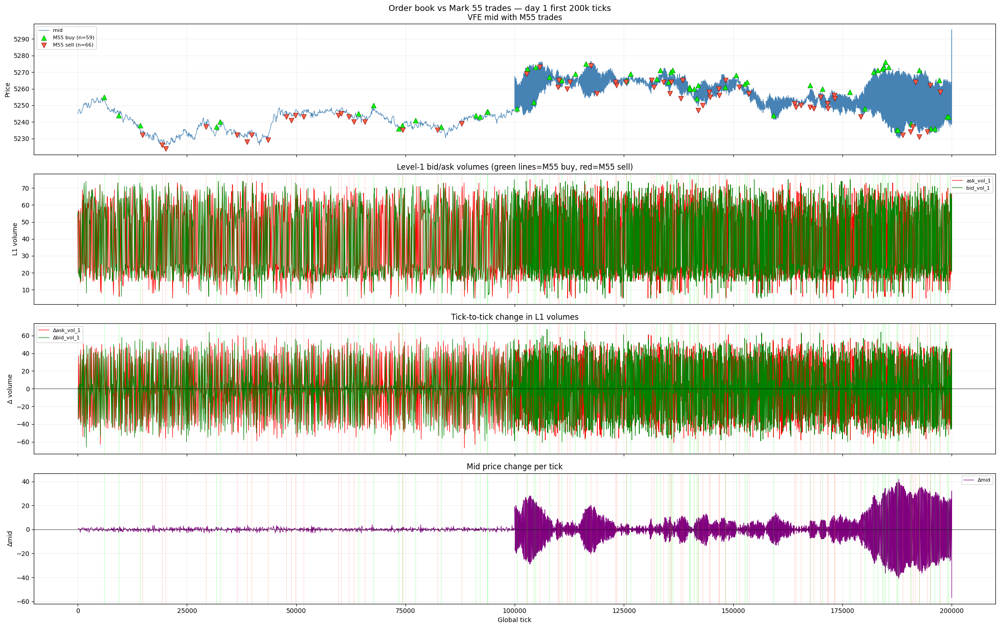

In [22]:
# ── Can we identify Mark 55 trades from the order book alone? ──
# Strategy: at each tick, look at bid/ask volumes. When M55 buys they lift the ask;
# the ask_volume_1 at that tick should drop by their qty. Compare orderbook state
# at M55 trade ticks vs non-M55 ticks to find a distinguishing fingerprint.

prod = 'VELVETFRUIT_EXTRACT'
ob = prices[prices['product'] == prod].sort_values('global_t').copy()
ob = ob[['global_t','day','timestamp','bid_price_1','bid_volume_1','ask_price_1','ask_volume_1',
          'bid_price_2','bid_volume_2','ask_price_2','ask_volume_2','mid_price']].copy()

# Diff in ask/bid volume tick-to-tick (book change)
ob['dask1'] = ob['ask_volume_1'].diff()   # negative = ask consumed = someone bought
ob['dbid1'] = ob['bid_volume_1'].diff()   # negative = bid consumed = someone sold
ob['dask2'] = ob['ask_volume_2'].diff()
ob['dbid2'] = ob['bid_volume_2'].diff()
ob['dmid']  = ob['mid_price'].diff()

# Tag ticks where M55 is buyer or seller
m55_all = trades[(trades['symbol']==prod) & ((trades['buyer']=='Mark 55')|(trades['seller']=='Mark 55'))].copy()
m55_all['is_buy'] = m55_all['buyer'] == 'Mark 55'
m55_buys  = set(m55_all[m55_all['is_buy']]['global_t'])
m55_sells = set(m55_all[~m55_all['is_buy']]['global_t'])

ob['m55_buy']  = ob['global_t'].isin(m55_buys)
ob['m55_sell'] = ob['global_t'].isin(m55_sells)
ob['m55_any']  = ob['m55_buy'] | ob['m55_sell']

HEAD = 200_000
ob_head = ob[ob['global_t'] <= HEAD]
m55_head = m55_all[m55_all['global_t'] <= HEAD]

# ── Plot 1: ask_volume_1 and bid_volume_1 over time with M55 trade markers ──
fig, axes = plt.subplots(4, 1, figsize=(22, 14), sharex=True)

ax = axes[0]
ax.plot(ob_head['global_t'], ob_head['mid_price'], color='steelblue', lw=0.8, label='mid')
buys_h  = m55_head[m55_head['is_buy']]
sells_h = m55_head[~m55_head['is_buy']]
ax.scatter(buys_h['global_t'],  buys_h['price'],  marker='^', s=60, color='lime',   edgecolors='green',   lw=0.7, zorder=5, label=f'M55 buy (n={len(buys_h)})')
ax.scatter(sells_h['global_t'], sells_h['price'], marker='v', s=60, color='tomato', edgecolors='darkred', lw=0.7, zorder=5, label=f'M55 sell (n={len(sells_h)})')
ax.set_ylabel('Price'); ax.legend(fontsize=8); ax.grid(alpha=0.2)
ax.set_title('VFE mid with M55 trades')

ax = axes[1]
ax.plot(ob_head['global_t'], ob_head['ask_volume_1'], color='red',   lw=0.8, label='ask_vol_1')
ax.plot(ob_head['global_t'], ob_head['bid_volume_1'], color='green', lw=0.8, label='bid_vol_1')
for t in buys_h['global_t']:  ax.axvline(t, color='lime',   lw=0.5, alpha=0.4)
for t in sells_h['global_t']: ax.axvline(t, color='tomato', lw=0.5, alpha=0.4)
ax.set_ylabel('L1 volume'); ax.legend(fontsize=8); ax.grid(alpha=0.2)
ax.set_title('Level-1 bid/ask volumes (green lines=M55 buy, red=M55 sell)')

ax = axes[2]
ax.plot(ob_head['global_t'], ob_head['dask1'], color='red',   lw=0.8, label='Δask_vol_1')
ax.plot(ob_head['global_t'], ob_head['dbid1'], color='green', lw=0.8, label='Δbid_vol_1')
ax.axhline(0, color='black', lw=0.5)
for t in buys_h['global_t']:  ax.axvline(t, color='lime',   lw=0.5, alpha=0.4)
for t in sells_h['global_t']: ax.axvline(t, color='tomato', lw=0.5, alpha=0.4)
ax.set_ylabel('Δ volume'); ax.legend(fontsize=8); ax.grid(alpha=0.2)
ax.set_title('Tick-to-tick change in L1 volumes')

ax = axes[3]
ax.plot(ob_head['global_t'], ob_head['dmid'], color='purple', lw=0.8, label='Δmid')
ax.axhline(0, color='black', lw=0.5)
for t in buys_h['global_t']:  ax.axvline(t, color='lime',   lw=0.5, alpha=0.4)
for t in sells_h['global_t']: ax.axvline(t, color='tomato', lw=0.5, alpha=0.4)
ax.set_ylabel('Δmid'); ax.legend(fontsize=8); ax.grid(alpha=0.2)
ax.set_title('Mid price change per tick')

axes[-1].set_xlabel('Global tick')
plt.suptitle('Order book vs Mark 55 trades — day 1 first 200k ticks', fontsize=13)
plt.tight_layout()
plt.savefig('m55_ob_analysis.png', dpi=130, bbox_inches='tight')
plt.show()


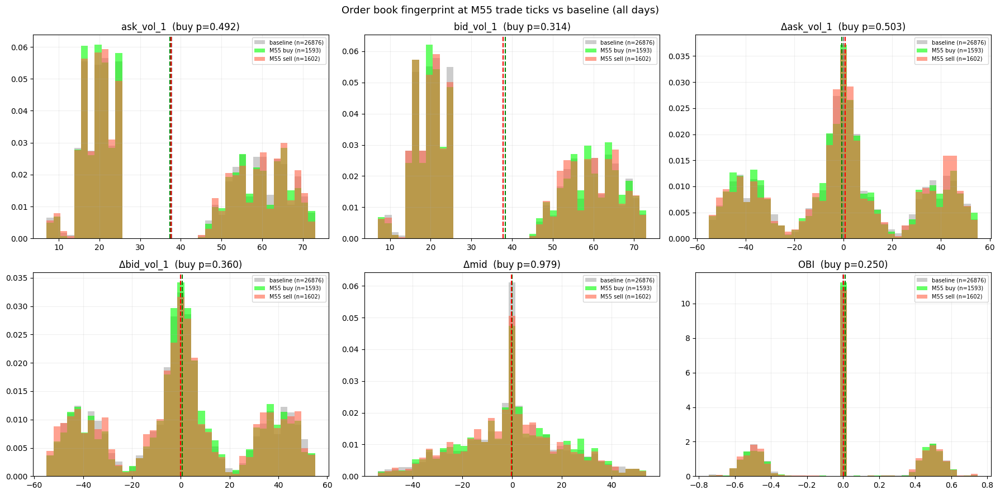


feature          baseline_mean  M55_buy_mean  M55_sell_mean    buy_p
ask_vol_1               37.763        37.390         37.547   0.4919
bid_vol_1               37.779        38.328         37.834   0.3139
Δask_vol_1              -0.011        -0.531          0.672   0.5030
Δbid_vol_1              -0.022         0.667         -0.170   0.3603
Δmid                     0.010        -0.005         -0.240   0.9792
OBI                      0.000         0.012          0.004   0.2495


In [26]:
# ── Statistical fingerprint: book state at M55 trade ticks vs baseline ──
from scipy import stats

# Compute obi on ob BEFORE filtering
ob['obi'] = ((ob['bid_volume_1'] - ob['ask_volume_1']) /
             (ob['bid_volume_1'] + ob['ask_volume_1']).replace(0, np.nan))

ob_full = ob.dropna(subset=['dask1','dbid1']).copy()
ob_full['m55_buy']  = ob_full['global_t'].isin(m55_buys)
ob_full['m55_sell'] = ob_full['global_t'].isin(m55_sells)
ob_full['m55_any']  = ob_full['m55_buy'] | ob_full['m55_sell']

baseline = ob_full[~ob_full['m55_any']]

cols   = ['ask_volume_1','bid_volume_1','dask1','dbid1','dmid','obi']
labels = ['ask_vol_1','bid_vol_1','Δask_vol_1','Δbid_vol_1','Δmid','OBI']

fig, axes = plt.subplots(2, 3, figsize=(18, 9))
axes = axes.flatten()

for ax, col, label in zip(axes, cols, labels):
    b  = ob_full[ob_full['m55_buy']][col].dropna()
    s  = ob_full[ob_full['m55_sell']][col].dropna()
    bl = baseline[col].dropna()

    lo = np.percentile(bl, 1); hi = np.percentile(bl, 99)
    bins = np.linspace(lo, hi, 40)

    ax.hist(bl, bins=bins, alpha=0.4, color='gray',   density=True, label=f'baseline (n={len(bl)})')
    ax.hist(b,  bins=bins, alpha=0.6, color='lime',   density=True, label=f'M55 buy (n={len(b)})')
    ax.hist(s,  bins=bins, alpha=0.6, color='tomato', density=True, label=f'M55 sell (n={len(s)})')

    _, p = stats.ttest_ind(b, bl, equal_var=False) if len(b) > 5 else (None, float('nan'))
    ax.set_title(f'{label}  (buy p={p:.3f})')
    ax.axvline(bl.mean(), color='gray',  lw=1.5, ls='--')
    ax.axvline(b.mean(),  color='green', lw=1.5, ls='--')
    ax.axvline(s.mean(),  color='red',   lw=1.5, ls='--')
    ax.legend(fontsize=7); ax.grid(alpha=0.2)

plt.suptitle('Order book fingerprint at M55 trade ticks vs baseline (all days)', fontsize=13)
plt.tight_layout()
plt.savefig('m55_ob_fingerprint.png', dpi=130, bbox_inches='tight')
plt.show()

print(f"\n{'feature':<15} {'baseline_mean':>14} {'M55_buy_mean':>13} {'M55_sell_mean':>14} {'buy_p':>8}")
for col, label in zip(cols, labels):
    b  = ob_full[ob_full['m55_buy']][col].dropna()
    s  = ob_full[ob_full['m55_sell']][col].dropna()
    bl = baseline[col].dropna()
    _, p = stats.ttest_ind(b, bl, equal_var=False) if len(b) > 5 else (None, float('nan'))
    print(f"{label:<15} {bl.mean():>14.3f} {b.mean():>13.3f} {s.mean():>14.3f} {p:>8.4f}")


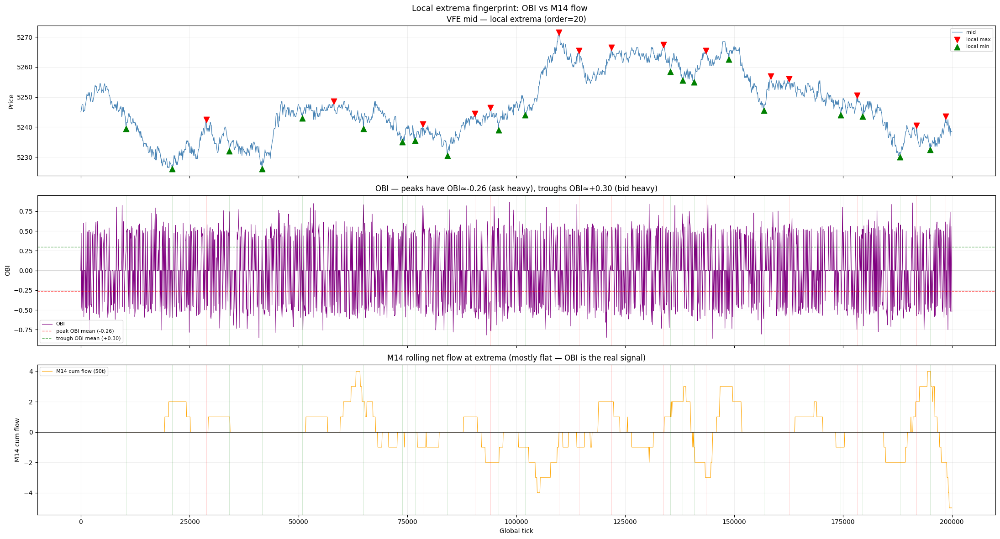

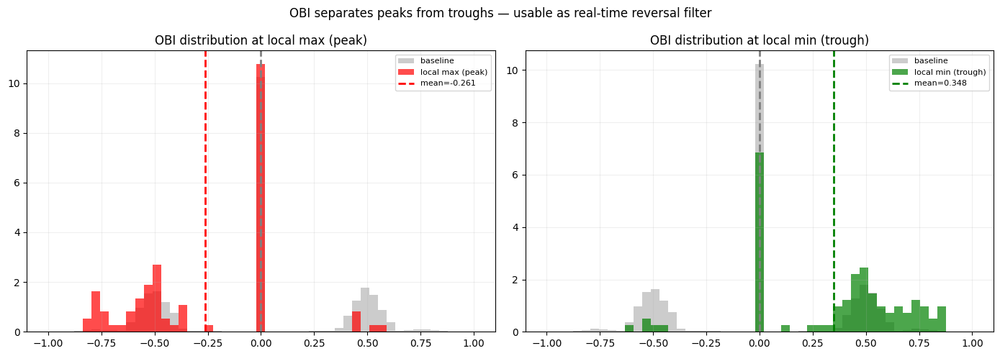

In [27]:
# ── OBI at local extrema vs baseline ──
# OBI = (bid_vol1 - ask_vol1) / (bid_vol1 + ask_vol1)
# Finding: OBI = -0.26 at peaks, +0.30 at troughs, ~0 at baseline → clean reversal signal

from scipy.signal import argrelextrema

prod = 'VELVETFRUIT_EXTRACT'
pmid = prices[prices['product']==prod][['global_t','mid_price','day',
       'bid_volume_1','ask_volume_1']].drop_duplicates('global_t').sort_values('global_t').reset_index(drop=True)
pmid['obi'] = ((pmid['bid_volume_1'] - pmid['ask_volume_1']) /
               (pmid['bid_volume_1'] + pmid['ask_volume_1']).replace(0, np.nan))

m14 = trades[(trades['symbol']==prod) & ((trades['buyer']=='Mark 14')|(trades['seller']=='Mark 14'))].copy()
m14['side'] = np.where(m14['buyer']=='Mark 14', 1, -1)
m14_flow = m14.groupby('global_t')['side'].sum()
pmid['m14_flow'] = pmid['global_t'].map(m14_flow).fillna(0)
pmid['m14_cum50'] = pmid['m14_flow'].rolling(50).sum()

ORDER = 20
lmax_idx = argrelextrema(pmid['mid_price'].values, np.greater, order=ORDER)[0]
lmin_idx = argrelextrema(pmid['mid_price'].values, np.less,    order=ORDER)[0]

HEAD = 200_000
pmid_head = pmid[pmid['global_t'] <= HEAD]
lmax_head = [i for i in lmax_idx if pmid.iloc[i]['global_t'] <= HEAD]
lmin_head = [i for i in lmin_idx if pmid.iloc[i]['global_t'] <= HEAD]

fig, axes = plt.subplots(3, 1, figsize=(22, 12), sharex=True)

ax = axes[0]
ax.plot(pmid_head['global_t'], pmid_head['mid_price'], color='steelblue', lw=0.9, label='mid')
ax.scatter(pmid.iloc[lmax_head]['global_t'], pmid.iloc[lmax_head]['mid_price'],
           marker='v', s=80, color='red',  zorder=5, label='local max')
ax.scatter(pmid.iloc[lmin_head]['global_t'], pmid.iloc[lmin_head]['mid_price'],
           marker='^', s=80, color='green', zorder=5, label='local min')
ax.set_ylabel('Price'); ax.legend(fontsize=8); ax.grid(alpha=0.2)
ax.set_title(f'VFE mid — local extrema (order={ORDER})')

ax = axes[1]
ax.plot(pmid_head['global_t'], pmid_head['obi'], color='purple', lw=0.8, label='OBI')
ax.axhline(0, color='black', lw=0.5)
ax.axhline(-0.26, color='red',   lw=1, ls='--', alpha=0.6, label='peak OBI mean (-0.26)')
ax.axhline(+0.30, color='green', lw=1, ls='--', alpha=0.6, label='trough OBI mean (+0.30)')
for i in lmax_head: ax.axvline(pmid.iloc[i]['global_t'], color='red',   lw=0.4, alpha=0.3)
for i in lmin_head: ax.axvline(pmid.iloc[i]['global_t'], color='green', lw=0.4, alpha=0.3)
ax.set_ylabel('OBI'); ax.legend(fontsize=8); ax.grid(alpha=0.2)
ax.set_title('OBI — peaks have OBI≈-0.26 (ask heavy), troughs OBI≈+0.30 (bid heavy)')

ax = axes[2]
ax.plot(pmid_head['global_t'], pmid_head['m14_cum50'], color='orange', lw=0.8, label='M14 cum flow (50t)')
ax.axhline(0, color='black', lw=0.5)
for i in lmax_head: ax.axvline(pmid.iloc[i]['global_t'], color='red',   lw=0.4, alpha=0.3)
for i in lmin_head: ax.axvline(pmid.iloc[i]['global_t'], color='green', lw=0.4, alpha=0.3)
ax.set_ylabel('M14 cum flow'); ax.legend(fontsize=8); ax.grid(alpha=0.2)
ax.set_title('M14 rolling net flow at extrema (mostly flat — OBI is the real signal)')

axes[-1].set_xlabel('Global tick')
plt.suptitle('Local extrema fingerprint: OBI vs M14 flow', fontsize=13)
plt.tight_layout()
plt.savefig('extrema_obi_m14.png', dpi=130, bbox_inches='tight')
plt.show()

# Distribution comparison
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
bins = np.linspace(-1, 1, 50)
for ax, (idx, label, color) in zip(axes, [
    (lmax_idx, 'local max (peak)', 'red'),
    (lmin_idx, 'local min (trough)', 'green'),
]):
    ax.hist(pmid['obi'].dropna(), bins=bins, alpha=0.4, density=True, color='gray', label='baseline')
    ax.hist(pmid.iloc[idx]['obi'].dropna(), bins=bins, alpha=0.7, density=True, color=color, label=label)
    ax.axvline(pmid['obi'].mean(), color='gray', lw=2, ls='--')
    ax.axvline(pmid.iloc[idx]['obi'].mean(), color=color, lw=2, ls='--',
               label=f'mean={pmid.iloc[idx]["obi"].mean():.3f}')
    ax.set_title(f'OBI distribution at {label}')
    ax.legend(fontsize=8); ax.grid(alpha=0.2)

plt.suptitle('OBI separates peaks from troughs — usable as real-time reversal filter', fontsize=12)
plt.tight_layout()
plt.savefig('obi_extrema_dist.png', dpi=130, bbox_inches='tight')
plt.show()


Mark 01: no trades in head window


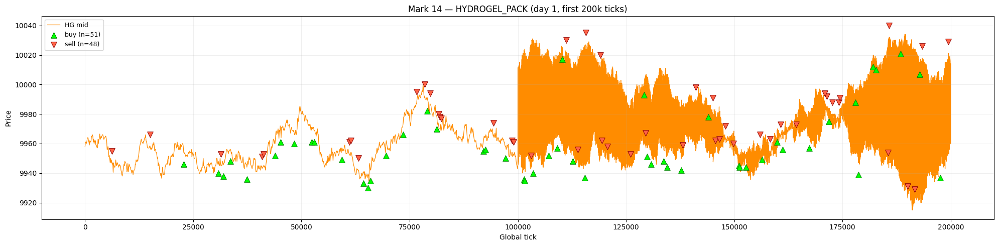

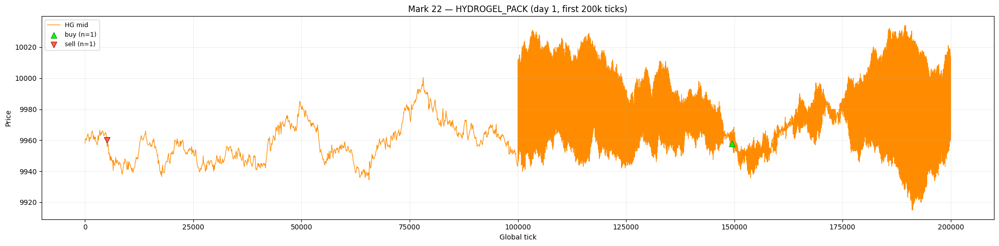

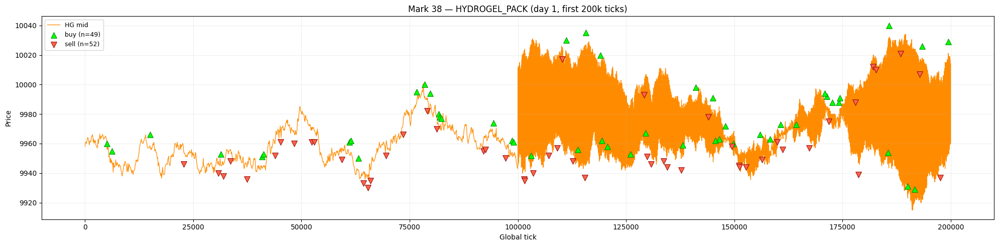

Mark 49: no trades in head window
Mark 55: no trades in head window
Mark 67: no trades in head window


In [25]:
# ── Each bot's buys/sells on HYDROGEL_PACK, day 1 head, one plot per bot ──
prod = 'HYDROGEL_PACK'
pdata = prices[prices['product'] == prod].sort_values('global_t')

HEAD = 200_000
pdata_head = pdata[pdata['global_t'] <= HEAD]

all_traders = sorted(set(trades['buyer']) | set(trades['seller']))

for trader in all_traders:
    t_df = trades[(trades['symbol'] == prod) &
                  ((trades['buyer'] == trader) | (trades['seller'] == trader))]
    t_head = t_df[t_df['global_t'] <= HEAD]
    buys  = t_head[t_head['buyer']  == trader]
    sells = t_head[t_head['seller'] == trader]

    if t_head.empty:
        print(f'{trader}: no trades in head window')
        continue

    fig, ax = plt.subplots(figsize=(20, 5))
    ax.plot(pdata_head['global_t'], pdata_head['mid_price'],
            color='darkorange', lw=0.9, label='HG mid', zorder=1)

    if not buys.empty:
        ax.scatter(buys['global_t'], buys['price'],
                   marker='^', s=70, color='lime', edgecolors='green', lw=0.7,
                   zorder=5, label=f'buy (n={len(buys)})')
    if not sells.empty:
        ax.scatter(sells['global_t'], sells['price'],
                   marker='v', s=70, color='tomato', edgecolors='darkred', lw=0.7,
                   zorder=5, label=f'sell (n={len(sells)})')

    ax.set_title(f'{trader} — HYDROGEL_PACK (day 1, first {HEAD//1000}k ticks)')
    ax.set_xlabel('Global tick')
    ax.set_ylabel('Price')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.2)
    plt.tight_layout()
    plt.savefig(f'hg_{trader.replace(" ", "_")}_head.png', dpi=130, bbox_inches='tight')
    plt.show()


# Option Pricing — VEV_XXXX (calls on VFE)

Products `VEV_4000` through `VEV_6500` are European call options on VFE expiring at end of day 3.
- **T** = fraction of 3-day window remaining (T=3 at start of day 1, T=0 at end of day 3)
- **σ** (IV) ≈ 0.019–0.021 across all liquid strikes — extremely stable
- Deep ITM strikes (4000, 4500) trade at intrinsic; OTM (6000, 6500) trade at near-zero → only use strikes 5000–5500 for IV fitting

In [31]:
# ── Option pricing: Black-Scholes IV across all strikes and time ──
from scipy.stats import norm
from scipy.optimize import brentq
import warnings
warnings.filterwarnings('ignore')

def bs_call_vec(S, K, T, sigma, r=0):
    S, K, T, sigma = (np.asarray(x, dtype=float) for x in (S, K, T, sigma))
    result = np.maximum(S - K, 0.0)
    v = (T > 0) & (sigma > 0)
    if v.any():
        Sv, Kv, Tv, sv = S[v], K[v], T[v], sigma[v]
        d1 = (np.log(Sv / Kv) + 0.5 * sv**2 * Tv) / (sv * np.sqrt(Tv))
        d2 = d1 - sv * np.sqrt(Tv)
        result[v] = Sv * norm.cdf(d1) - Kv * np.exp(-r * Tv) * norm.cdf(d2)
    return result

def bs_call(S, K, T, sigma, r=0):
    """Scalar wrapper used for IV inversion."""
    if T <= 0 or sigma <= 0:
        return float(max(S - K, 0.0))
    d1 = (np.log(S / K) + 0.5 * sigma**2 * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    return float(S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2))

def implied_vol_vec(prices, S, K, T, r=0, lo=1e-6, hi=10.0):
    """Vectorized IV: compute IV for each element, return array with nan where not solvable."""
    prices, S, K, T = (np.asarray(x, dtype=float) for x in (prices, S, K, T))
    intrinsic = np.maximum(S - K, 0.0)
    iv = np.full(len(prices), np.nan)
    # Only attempt where price > intrinsic+1 and T > 0 and price > 0.5
    mask = (prices > 0.5) & (prices >= intrinsic - 1) & (T > 0.01)
    for i in np.where(mask)[0]:
        try:
            lo_p = bs_call(S[i], K[i], T[i], lo, r)
            hi_p = bs_call(S[i], K[i], T[i], hi, r)
            if lo_p <= prices[i] <= hi_p:
                iv[i] = brentq(lambda v: bs_call(S[i], K[i], T[i], v, r) - prices[i], lo, hi)
        except Exception:
            pass
    return iv

# Build option dataframe with T and underlying S
vfe_mid = prices[prices['product'] == 'VELVETFRUIT_EXTRACT'][['global_t', 'mid_price']].drop_duplicates('global_t').sort_values('global_t')

opts = prices[prices['product'].str.startswith('VEV_')].copy()
opts['strike'] = opts['product'].str.replace('VEV_', '').astype(int)
opts = opts.drop_duplicates(subset=['global_t', 'strike']).sort_values('global_t').reset_index(drop=True)
opts = pd.merge_asof(opts, vfe_mid.rename(columns={'mid_price': 'S'}), on='global_t', direction='nearest')

# T = TTE in calendar days; TTE=5 at day3 start, each sim day = 1 calendar day
opts['step'] = (opts['day'] - 1) * 10000 + opts['timestamp'] // 100
opts['T'] = 5 + (20000 - opts['step']) / 10000  # TTE=5 at day3 start, each sim day = 1 calendar day

# Compute IV for liquid strikes only
liquid_strikes = [5000, 5100, 5200, 5300, 5400, 5500]
strike_colors  = {5000: 'steelblue', 5100: 'darkorange', 5200: 'green',
                  5300: 'red', 5400: 'purple', 5500: 'brown'}
opts_liq = opts[opts['strike'].isin(liquid_strikes) & (opts['T'] > 0.02)].copy()

# Vectorized IV computation per strike group (brentq still per-row but no Python apply overhead)
iv_parts = []
for strike, grp in opts_liq.groupby('strike'):
    iv = implied_vol_vec(grp['mid_price'].values, grp['S'].values,
                         np.full(len(grp), strike, dtype=float), grp['T'].values)
    iv_parts.append(pd.Series(iv, index=grp.index))
opts_liq['iv'] = pd.concat(iv_parts).sort_index()

print("IV summary by strike (all days):")
print(opts_liq.groupby('strike')['iv'].describe()[['count','mean','std','min','50%','max']].round(4))

print("\nIV at start of each day (strike=5300):")
for day in [1, 2, 3]:
    row = opts_liq[(opts_liq['strike'] == 5300) & (opts_liq['day'] == day)].iloc[0]
    print(f"  Day {day}: S={row['S']:.1f}  K=5300  T={row['T']:.2f}  opt={row['mid_price']:.1f}  IV={row['iv']:.4f}")

IV summary by strike (all days):
          count    mean     std     min     50%     max
strike                                                 
5000    11983.0  0.0126  0.0007  0.0000  0.0126  0.0158
5100    12000.0  0.0124  0.0002  0.0111  0.0124  0.0135
5200    12000.0  0.0128  0.0001  0.0122  0.0128  0.0133
5300    12000.0  0.0129  0.0002  0.0124  0.0130  0.0134
5400    12000.0  0.0120  0.0001  0.0116  0.0120  0.0124
5500    12000.0  0.0130  0.0002  0.0121  0.0131  0.0135

IV at start of each day (strike=5300):
  Day 1: S=5245.0  K=5300  T=7.00  opt=47.0  IV=0.0128
  Day 2: S=5286.5  K=5300  T=5.10  opt=55.5  IV=0.0130
  Day 3: S=5251.5  K=5300  T=4.10  opt=33.5  IV=0.0128


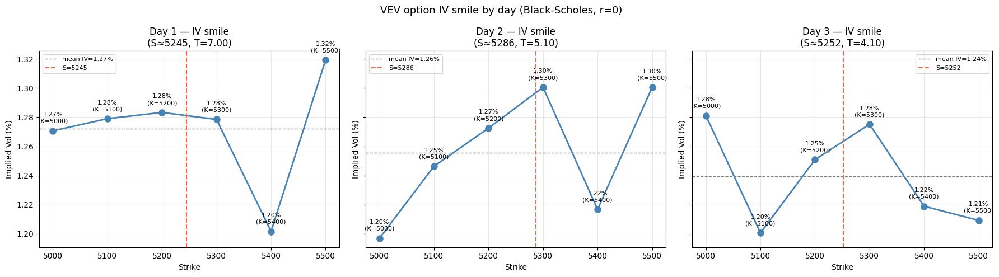

In [32]:
# ── IV smile across strikes — one subplot per day ──
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
colors = plt.cm.viridis(np.linspace(0, 0.85, len(liquid_strikes)))

for day, ax in zip([1, 2, 3], axes):
    # Sample at start of day only (first available timestamp per day)
    day_data = opts_liq[opts_liq['day'] == day].dropna(subset=['iv'])
    # Use a single snapshot per strike (first tick of each day)
    snap = day_data.groupby('strike').first().reset_index()
    
    ax.plot(snap['strike'], snap['iv'] * 100, 'o-', color='steelblue', lw=2, ms=8)
    ax.axhline(snap['iv'].mean() * 100, color='gray', lw=1, ls='--', label=f"mean IV={snap['iv'].mean()*100:.2f}%")
    
    for _, r in snap.iterrows():
        moneyness = r['S'] / r['strike'] - 1
        ax.annotate(f"{r['iv']*100:.2f}%\n(K={int(r['strike'])})",
                    xy=(r['strike'], r['iv'] * 100),
                    xytext=(0, 10), textcoords='offset points',
                    fontsize=8, ha='center')
    
    ax.axvline(snap['S'].iloc[0], color='tomato', lw=1.5, ls='--', label=f"S={snap['S'].iloc[0]:.0f}")
    ax.set_title(f'Day {day} — IV smile\n(S≈{snap["S"].iloc[0]:.0f}, T={snap["T"].iloc[0]:.2f})')
    ax.set_xlabel('Strike')
    ax.set_ylabel('Implied Vol (%)')
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)

plt.suptitle('VEV option IV smile by day (Black-Scholes, r=0)', fontsize=13)
plt.tight_layout()
plt.savefig('iv_smile.png', dpi=130, bbox_inches='tight')
plt.show()

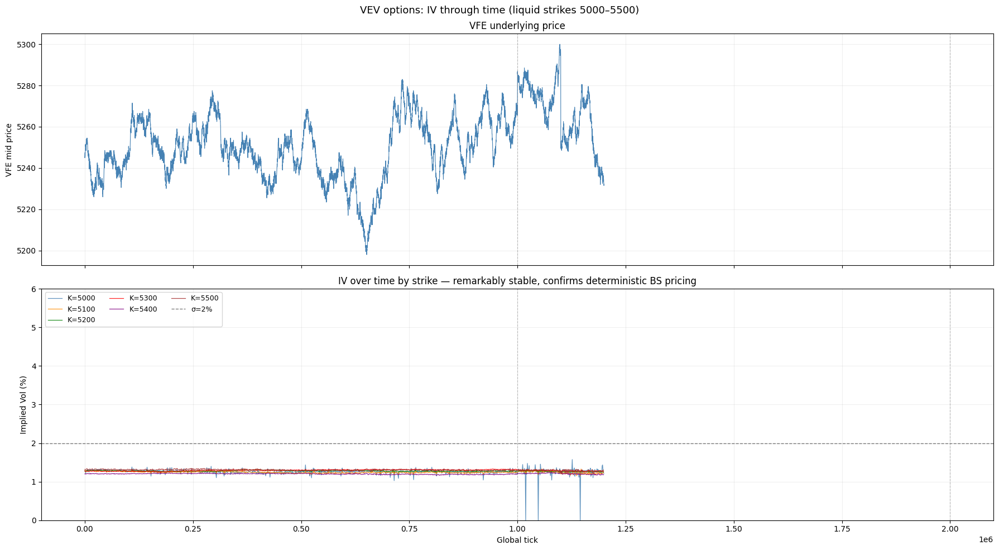

Consensus IV: 1.271%  (median across all liquid strikes & ticks)
Std dev of IV: 0.046%  — very tight, market is BS-priced at fixed σ


In [33]:
# ── IV over time — rolling fitted IV per strike, all 3 days ──
fig, axes = plt.subplots(2, 1, figsize=(18, 10), sharex=True)
strike_colors = {5000: 'steelblue', 5100: 'darkorange', 5200: 'green',
                 5300: 'red', 5400: 'purple', 5500: 'brown'}

ax = axes[0]
ax.plot(vfe_mid['global_t'], vfe_mid['mid_price'], color='steelblue', lw=0.8)
ax.set_ylabel('VFE mid price')
ax.set_title('VFE underlying price')
for d in [2, 3]:
    ax.axvline((d - 1) * 1_000_000, color='gray', lw=0.8, ls='--', alpha=0.5)
ax.grid(alpha=0.2)

ax = axes[1]
for strike in liquid_strikes:
    sub = opts_liq[opts_liq['strike'] == strike].dropna(subset=['iv'])
    # Thin out to every 10th point for plot clarity
    sub = sub.iloc[::10]
    ax.plot(sub['global_t'], sub['iv'] * 100, lw=0.9, label=f'K={strike}', 
            color=strike_colors[strike], alpha=0.85)

# Mark the consensus IV (~2%)
ax.axhline(2.0, color='black', lw=1, ls='--', alpha=0.5, label='σ=2%')
for d in [2, 3]:
    ax.axvline((d - 1) * 1_000_000, color='gray', lw=0.8, ls='--', alpha=0.5)

ax.set_ylabel('Implied Vol (%)')
ax.set_xlabel('Global tick')
ax.set_title('IV over time by strike — remarkably stable, confirms deterministic BS pricing')
ax.legend(fontsize=9, ncol=3)
ax.set_ylim(0, 6)
ax.grid(alpha=0.2)

plt.suptitle('VEV options: IV through time (liquid strikes 5000–5500)', fontsize=13)
plt.tight_layout()
plt.savefig('iv_over_time.png', dpi=130, bbox_inches='tight')
plt.show()

# Fit a single consensus σ using all liquid option prices
all_ivs = opts_liq['iv'].dropna()
print(f"Consensus IV: {all_ivs.median()*100:.3f}%  (median across all liquid strikes & ticks)")
print(f"Std dev of IV: {all_ivs.std()*100:.3f}%  — very tight, market is BS-priced at fixed σ")

Using consensus σ = 0.0127 (1.271%)


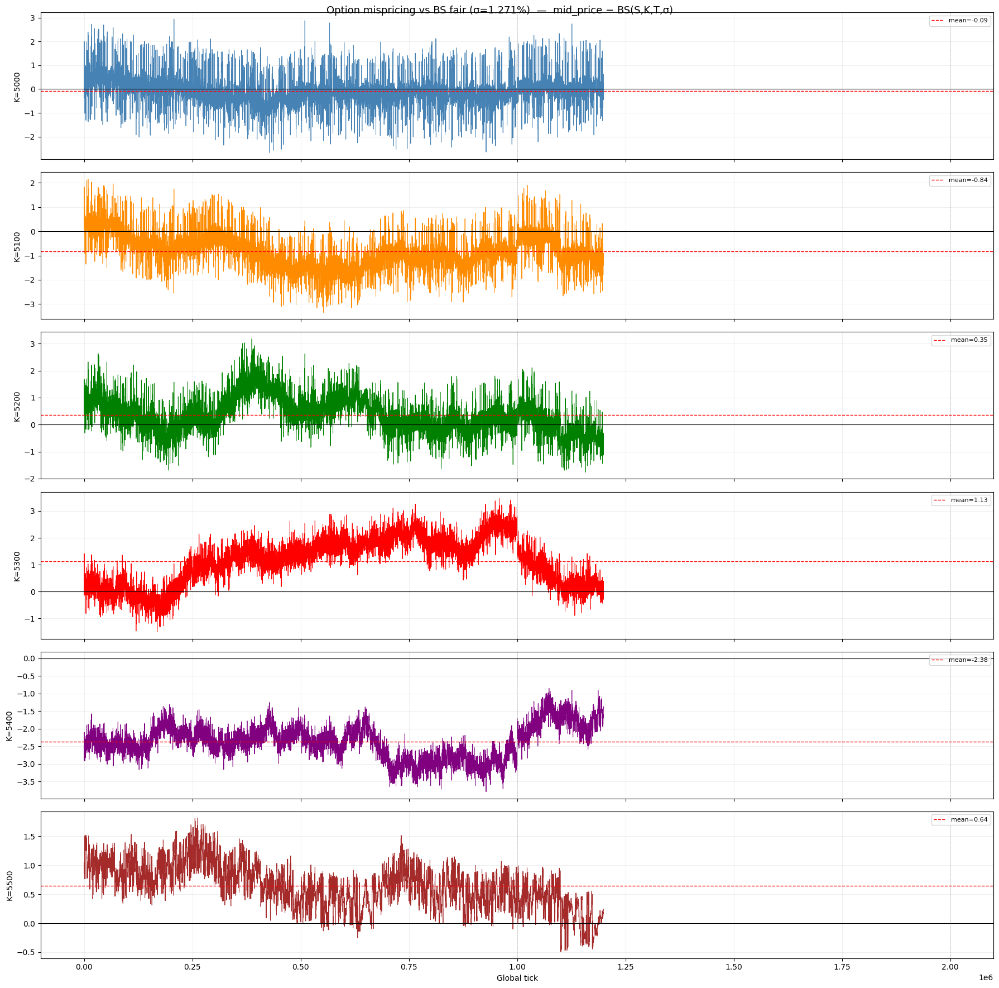


Mispricing summary by strike:
         mean    std    min    50%    max
strike                                   
5000   -0.094  0.571 -2.672 -0.122  2.940
5100   -0.838  0.682 -3.343 -0.872  2.157
5200    0.355  0.655 -1.762  0.308  3.183
5300    1.135  0.875 -1.503  1.264  3.466
5400   -2.378  0.481 -3.795 -2.372 -0.849
5500    0.643  0.381 -0.489  0.650  1.815


In [34]:
# ── Option mispricing: market price vs BS fair value at consensus σ ──
SIGMA = float(opts_liq['iv'].median())
print(f"Using consensus σ = {SIGMA:.4f} ({SIGMA*100:.3f}%)")

opts_liq = opts_liq.copy()
# Fully vectorized fair value
opts_liq['bs_fair'] = bs_call_vec(
    opts_liq['S'].values, opts_liq['strike'].values.astype(float),
    opts_liq['T'].values, np.full(len(opts_liq), SIGMA)
)
opts_liq['mispricing'] = opts_liq['mid_price'] - opts_liq['bs_fair']

# Plot mispricing over time for each strike
fig, axes = plt.subplots(len(liquid_strikes), 1, figsize=(18, 3 * len(liquid_strikes)), sharex=True)
for ax, strike in zip(axes, liquid_strikes):
    sub = opts_liq[opts_liq['strike'] == strike].dropna(subset=['mispricing'])
    ax.plot(sub['global_t'], sub['mispricing'], lw=0.7, color=strike_colors[strike])
    ax.axhline(0, color='black', lw=0.8)
    ax.axhline(sub['mispricing'].mean(), color='red', lw=1, ls='--',
               label=f"mean={sub['mispricing'].mean():.2f}")
    for d in [2, 3]:
        ax.axvline((d - 1) * 1_000_000, color='gray', lw=0.6, ls='--', alpha=0.4)
    ax.set_ylabel(f'K={strike}')
    ax.legend(fontsize=8, loc='upper right')
    ax.grid(alpha=0.2)

axes[-1].set_xlabel('Global tick')
plt.suptitle(f'Option mispricing vs BS fair (σ={SIGMA*100:.3f}%)  —  mid_price − BS(S,K,T,σ)', fontsize=13)
plt.tight_layout()
plt.savefig('option_mispricing.png', dpi=130, bbox_inches='tight')
plt.show()

print("\nMispricing summary by strike:")
print(opts_liq.groupby('strike')['mispricing'].describe()[['mean','std','min','50%','max']].round(3))

Option trades by trader:
trader        buy   sell   avg_buy_edge   total_pnl
Mark 01     buy:1339  sell:   0  avg_buy_edge:   0.11  total_pnl:       378
Mark 14     buy: 315  sell: 207  avg_buy_edge:   1.73  total_pnl:      8024
Mark 22     buy:   6  sell:1433  avg_buy_edge:   5.20  total_pnl:       377
Mark 38     buy: 218  sell: 238  avg_buy_edge: -16.73  total_pnl:     -8779

Total option trades: 1878
Strikes traded: [np.int64(4000), np.int64(4500), np.int64(5000), np.int64(5100), np.int64(5200), np.int64(5300), np.int64(5400), np.int64(5500), np.int64(6000), np.int64(6500)]


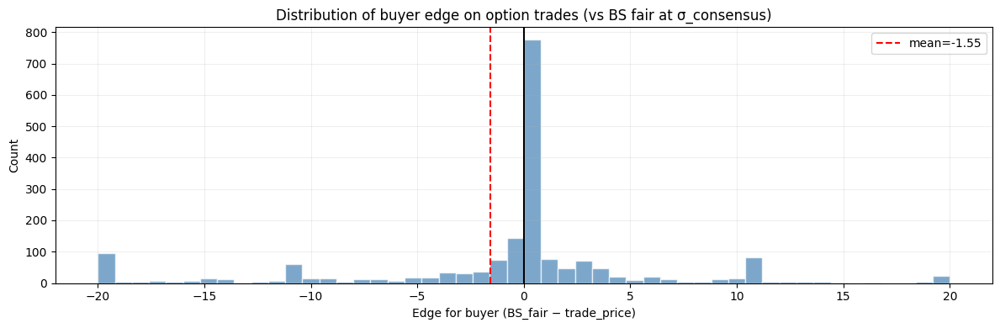

In [35]:
# ── Option trade analysis: who trades options and at what price vs fair? ──
opt_trades = trades[trades['symbol'].str.startswith('VEV_')].copy()
opt_trades['strike'] = opt_trades['symbol'].str.replace('VEV_', '').astype(int)
opt_trades['global_t'] = (opt_trades['day'] - 1) * 1_000_000 + opt_trades['timestamp']

opt_trades = pd.merge_asof(
    opt_trades.sort_values('global_t'),
    vfe_mid.rename(columns={'mid_price': 'S'}),
    on='global_t', direction='nearest'
)
opt_trades['step'] = (opt_trades['day'] - 1) * 10000 + opt_trades['timestamp'] // 100
opt_trades['T'] = 5 + (20000 - opt_trades['step']) / 10000  # TTE=5 at day3 start

# Vectorized fair value for all option trades at once
T_safe = opt_trades['T'].values.clip(0.01)
opt_trades['bs_fair'] = bs_call_vec(
    opt_trades['S'].values, opt_trades['strike'].values.astype(float),
    T_safe, np.full(len(opt_trades), SIGMA)
)
opt_trades['edge_buyer']  = opt_trades['bs_fair'] - opt_trades['price']
opt_trades['edge_seller'] = opt_trades['price']   - opt_trades['bs_fair']

print("Option trades by trader:")
print(f"{'trader':<10}  {'buy':>5}  {'sell':>5}  {'avg_buy_edge':>13}  {'total_pnl':>10}")
for tr in sorted(set(opt_trades['buyer']) | set(opt_trades['seller'])):
    b = opt_trades[opt_trades['buyer']  == tr]
    s = opt_trades[opt_trades['seller'] == tr]
    if len(b) + len(s) == 0:
        continue
    b_edge = (b['edge_buyer']  * b['quantity']).sum()
    s_edge = (s['edge_seller'] * s['quantity']).sum()
    avg_b  = b['edge_buyer'].mean() if len(b) else float('nan')
    print(f"{tr:<10}  buy:{len(b):>4}  sell:{len(s):>4}  avg_buy_edge:{avg_b:>7.2f}  total_pnl:{b_edge+s_edge:>10.0f}")

print(f"\nTotal option trades: {len(opt_trades)}")
print(f"Strikes traded: {sorted(opt_trades['strike'].unique())}")

fig, ax = plt.subplots(figsize=(12, 4))
ax.hist(opt_trades['edge_buyer'].clip(-20, 20), bins=50, color='steelblue', alpha=0.7, edgecolor='white')
ax.axvline(0, color='black', lw=1.5)
ax.axvline(opt_trades['edge_buyer'].mean(), color='red', lw=1.5, ls='--',
           label=f"mean={opt_trades['edge_buyer'].mean():.2f}")
ax.set_xlabel('Edge for buyer (BS_fair − trade_price)')
ax.set_ylabel('Count')
ax.set_title('Distribution of buyer edge on option trades (vs BS fair at σ_consensus)')
ax.legend(); ax.grid(alpha=0.2)
plt.tight_layout()
plt.savefig('option_trade_edge.png', dpi=130, bbox_inches='tight')
plt.show()